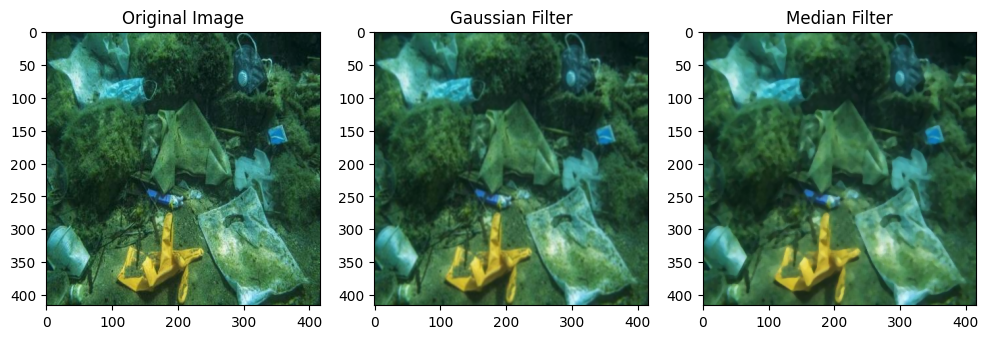

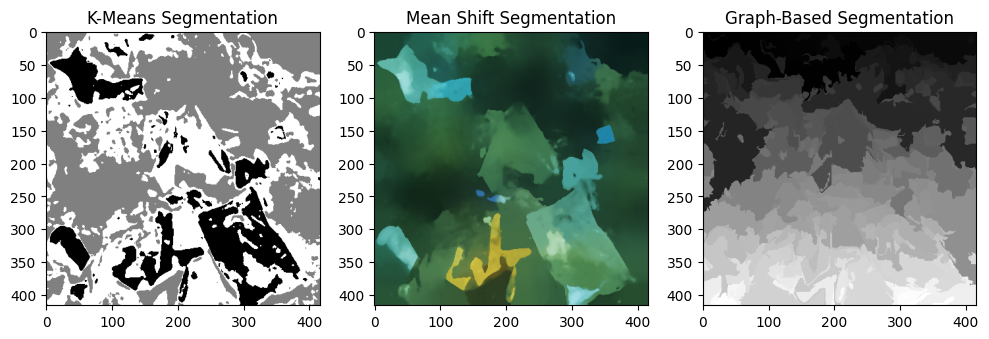

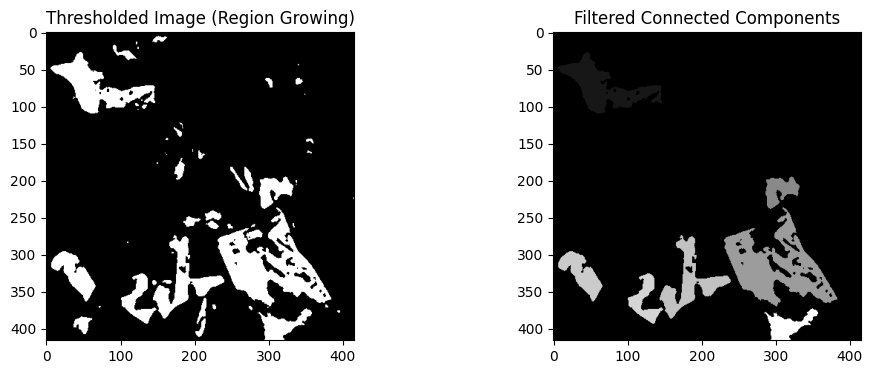

IoU Score: 0.8739
Dice Coefficient: 0.9327
Pixel Accuracy: 0.9829


In [2]:
import cv2
import numpy as np
from skimage.segmentation import felzenszwalb
from skimage.measure import label, regionprops
from sklearn.cluster import KMeans
from scipy.ndimage import label as ndi_label
import matplotlib.pyplot as plt

# Load the image
image_path = "/kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/images/66b85ac2-5d1b-4783-b0fa-4f8adcda51a5_jpg.rf.33eb90a2198eccbfbc6e7961b953ac4a.jpg"  # Change this to your image path
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB

# ---------------- SECTION 2: NOISE REDUCTION ----------------
# Apply Gaussian Filter (Linear)
gaussian_filtered = cv2.GaussianBlur(image, (5, 5), 0)

# Apply Median Filter (Non-Linear)
median_filtered = cv2.medianBlur(image, 5)

# Show Filtering Results
fig, ax = plt.subplots(1, 3, figsize=(12, 4))
ax[0].imshow(image)
ax[0].set_title("Original Image")
ax[1].imshow(gaussian_filtered)
ax[1].set_title("Gaussian Filter")
ax[2].imshow(median_filtered)
ax[2].set_title("Median Filter")
plt.show()

# ---------------- SECTION 3: SEGMENTATION ----------------
# Convert to grayscale
gray = cv2.cvtColor(median_filtered, cv2.COLOR_RGB2GRAY)

# K-Means Segmentation
kmeans = KMeans(n_clusters=3, random_state=0, n_init=10)
flat_img = gray.reshape((-1, 1))
kmeans.fit(flat_img)
kmeans_result = kmeans.labels_.reshape(gray.shape)

# Mean Shift Segmentation
mean_shift_result = cv2.pyrMeanShiftFiltering(median_filtered, 21, 51)

# Graph-Based Segmentation (Felzenszwalb)
graph_result = felzenszwalb(median_filtered, scale=100, sigma=0.5, min_size=50)

# Show Segmentation Results
fig, ax = plt.subplots(1, 3, figsize=(12, 4))
ax[0].imshow(kmeans_result, cmap="gray")
ax[0].set_title("K-Means Segmentation")
ax[1].imshow(mean_shift_result)
ax[1].set_title("Mean Shift Segmentation")
ax[2].imshow(graph_result, cmap="gray")
ax[2].set_title("Graph-Based Segmentation")
plt.show()

# ---------------- SECTION 4: REGION-BASED PROCESSING ----------------
# Region Growing (Thresholding as Seed Selection)
_, thresh = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)
labeled, num_features = ndi_label(thresh)

# Connected Component Analysis
labeled_img = label(thresh)
regions = regionprops(labeled_img)

# Filter out small noisy regions
min_size = 500  # Minimum region size
for region in regions:
    if region.area < min_size:
        for coords in region.coords:
            labeled_img[coords[0], coords[1]] = 0

# Show Region Processing Results
fig, ax = plt.subplots(1, 2, figsize=(12, 4))
ax[0].imshow(thresh, cmap="gray")
ax[0].set_title("Thresholded Image (Region Growing)")
ax[1].imshow(labeled_img, cmap="gray")
ax[1].set_title("Filtered Connected Components")
plt.show()

# ---------------- SECTION 5: EVALUATION METRICS ----------------
def compute_metrics(pred, ground_truth):
    """ Compute IoU, Dice Coefficient, and Pixel Accuracy """
    intersection = np.logical_and(pred, ground_truth)
    union = np.logical_or(pred, ground_truth)
    
    IoU = np.sum(intersection) / np.sum(union) if np.sum(union) != 0 else 0
    Dice = (2 * np.sum(intersection)) / (np.sum(pred) + np.sum(ground_truth)) if (np.sum(pred) + np.sum(ground_truth)) != 0 else 0
    Pixel_Accuracy = np.sum(pred == ground_truth) / pred.size
    
    return IoU, Dice, Pixel_Accuracy

# Convert to binary masks for evaluation
ground_truth = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)[1] // 255
predicted_segmentation = labeled_img > 0

# Compute Metrics
iou, dice, pixel_acc = compute_metrics(predicted_segmentation, ground_truth)

print(f"IoU Score: {iou:.4f}")
print(f"Dice Coefficient: {dice:.4f}")
print(f"Pixel Accuracy: {pixel_acc:.4f}")


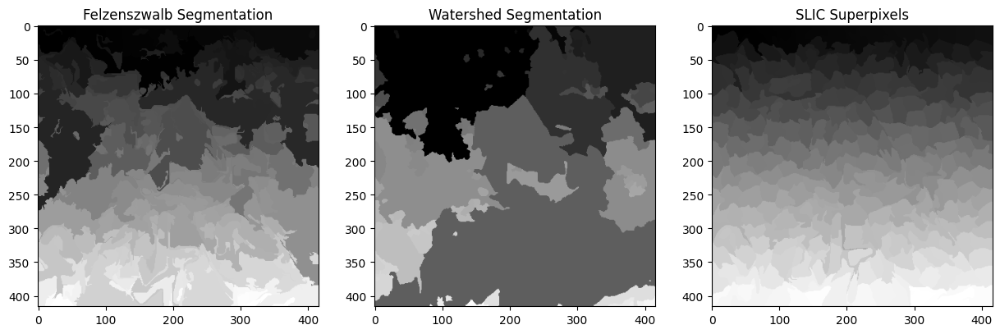


0: 640x640 (no detections), 8.2ms
Speed: 2.5ms preprocess, 8.2ms inference, 0.7ms postprocess per image at shape (1, 3, 640, 640)


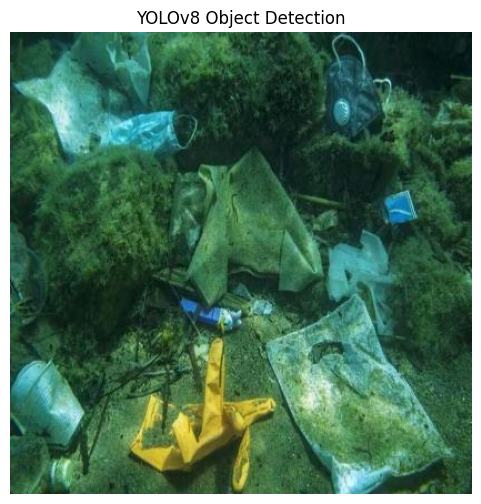

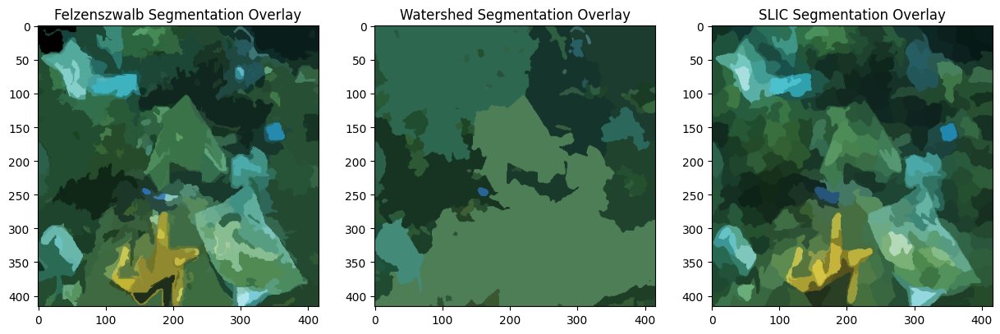

IoU Score: 0.5039
Dice Coefficient: 0.6701
Pixel Accuracy: 0.5039


In [21]:
import cv2
import numpy as np
from skimage.segmentation import felzenszwalb, watershed, slic
from skimage.restoration import denoise_tv_chambolle  # Anisotropic Filtering
from skimage.measure import label, regionprops
from sklearn.cluster import KMeans
from scipy.ndimage import label as ndi_label
import matplotlib.pyplot as plt
from ultralytics import YOLO  # Import YOLOv8

# Load the image
image_path = "/kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/images/66b85ac2-5d1b-4783-b0fa-4f8adcda51a5_jpg.rf.33eb90a2198eccbfbc6e7961b953ac4a.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB

# ---------------- SECTION 2: NOISE REDUCTION ----------------
# Apply Median Filter (Non-Linear)
median_filtered = cv2.medianBlur(image, 5)

# Convert to grayscale
gray = cv2.cvtColor(median_filtered, cv2.COLOR_RGB2GRAY)

# Apply Histogram Equalization for Contrast Enhancement
gray = cv2.equalizeHist(gray)

# ---------------- SECTION 3: SEGMENTATION ----------------
# Graph-Based Segmentation (Felzenszwalb)
felzenszwalb_result = felzenszwalb(median_filtered, scale=100, sigma=0.5, min_size=50)

# Graph-Based Segmentation (Watershed)
gradient = cv2.morphologyEx(gray, cv2.MORPH_GRADIENT, np.ones((3,3), np.uint8))
_, markers = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
markers = cv2.connectedComponents(markers.astype(np.uint8))[1]
watershed_result = watershed(gradient, markers)

# Graph-Based Segmentation (SLIC Superpixels)
slic_result = slic(median_filtered, n_segments=300, compactness=10, sigma=1)

# Show Segmentation Results
fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].imshow(felzenszwalb_result, cmap="gray")
ax[0].set_title("Felzenszwalb Segmentation")
ax[1].imshow(watershed_result, cmap="gray")
ax[1].set_title("Watershed Segmentation")
ax[2].imshow(slic_result, cmap="gray")
ax[2].set_title("SLIC Superpixels")
plt.show()

# ---------------- SECTION 4: OBJECT DETECTION ----------------
# Load YOLOv8 Model (Pre-trained on COCO dataset)
model = YOLO("yolov8n.pt")

# Run Object Detection
results = model(image)

# Draw bounding boxes on detected objects
def draw_boxes(img, results):
    for result in results:
        for box in result.boxes:
            x1, y1, x2, y2 = map(int, box.xyxy[0])  # Bounding box coordinates
            conf = float(box.conf[0])  # Confidence score
            cls = int(box.cls[0])  # Class index
            label = f"{model.names[cls]} {conf:.2f}"
            img = cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 3)
            img = cv2.putText(img, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 0, 0), 2)
    return img

# Draw detected objects
detection_image = draw_boxes(image.copy(), results)

# Show Object Detection Results
plt.figure(figsize=(6, 6))
plt.imshow(detection_image)
plt.title("YOLOv8 Object Detection")
plt.axis("off")
plt.show()

# ---------------- SECTION 5: COMPARING DETECTION WITH SEGMENTATION ----------------
# Overlay Segmentation and Object Detection
from skimage.color import label2rgb

felzenszwalb_overlay = label2rgb(felzenszwalb_result, image, kind='avg')
watershed_overlay = label2rgb(watershed_result, image, kind='avg')
slic_overlay = label2rgb(slic_result, image, kind='avg')

fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].imshow(felzenszwalb_overlay)
ax[0].set_title("Felzenszwalb Segmentation Overlay")
ax[1].imshow(watershed_overlay)
ax[1].set_title("Watershed Segmentation Overlay")
ax[2].imshow(slic_overlay)
ax[2].set_title("SLIC Segmentation Overlay")
plt.show()

# ---------------- SECTION 6: EVALUATION METRICS ----------------
def compute_metrics(pred, ground_truth):
    """ Compute IoU, Dice Coefficient, and Pixel Accuracy """
    intersection = np.logical_and(pred, ground_truth)
    union = np.logical_or(pred, ground_truth)
    
    IoU = np.sum(intersection) / np.sum(union) if np.sum(union) != 0 else 0
    Dice = (2 * np.sum(intersection)) / (np.sum(pred) + np.sum(ground_truth)) if (np.sum(pred) + np.sum(ground_truth)) != 0 else 0
    Pixel_Accuracy = np.sum(pred == ground_truth) / pred.size
    
    return IoU, Dice, Pixel_Accuracy

# Convert to binary masks for evaluation
ground_truth = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)[1] // 255
predicted_segmentation = watershed_result > 0

# Compute Metrics
iou, dice, pixel_acc = compute_metrics(predicted_segmentation, ground_truth)

print(f"IoU Score: {iou:.4f}")
print(f"Dice Coefficient: {dice:.4f}")
print(f"Pixel Accuracy: {pixel_acc:.4f}")


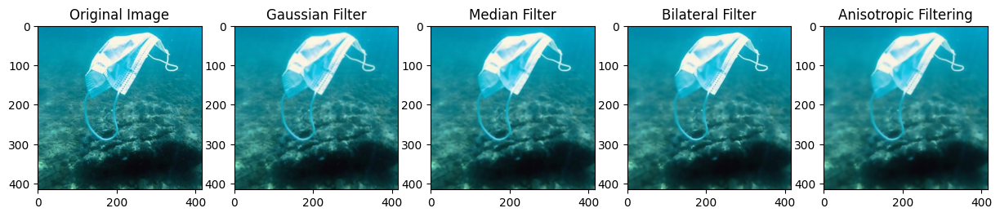

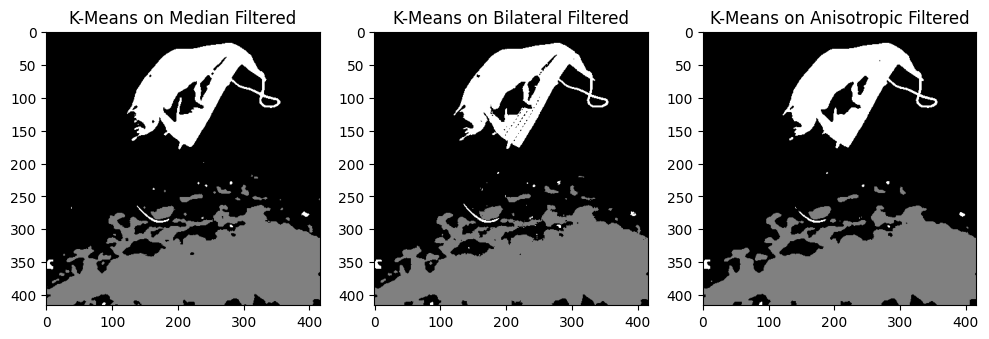

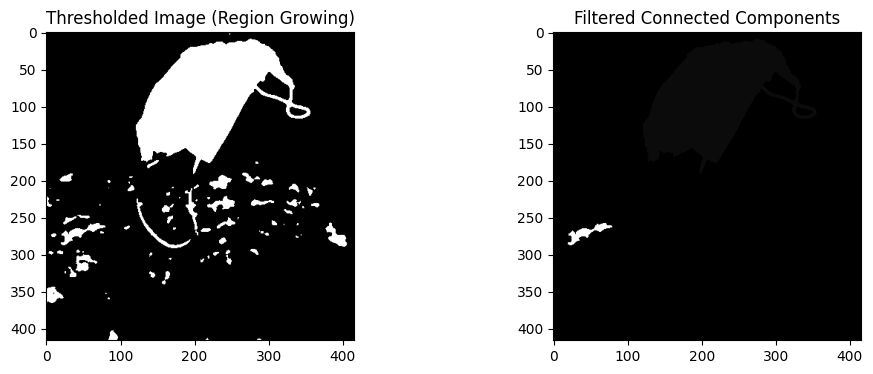

IoU Score: 0.8078
Dice Coefficient: 0.8937
Pixel Accuracy: 0.9709


In [6]:
import cv2
import numpy as np
from skimage.segmentation import felzenszwalb
from skimage.restoration import denoise_tv_chambolle  # Anisotropic Filtering
from skimage.measure import label, regionprops
from sklearn.cluster import KMeans
from scipy.ndimage import label as ndi_label
import matplotlib.pyplot as plt

# Load the image
image_path = "/kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/images/file-20201009-15-l-1atu53y_jpeg_jpg.rf.d0aa2269b6cf600552d64dcd3e7ab14d.jpg"  # Change this to your image path
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB

# ---------------- SECTION 2: NOISE REDUCTION ----------------
# Apply Gaussian Filter (Linear)
gaussian_filtered = cv2.GaussianBlur(image, (5, 5), 0)

# Apply Median Filter (Non-Linear)
median_filtered = cv2.medianBlur(image, 5)

# Apply Bilateral Filter
bilateral_filtered = cv2.bilateralFilter(image, 9, 75, 75)

# Apply Anisotropic Diffusion Filtering (Total Variation Denoising)
anisotropic_filtered = denoise_tv_chambolle(image, weight=0.1, channel_axis=-1)

# Show Filtering Results
fig, ax = plt.subplots(1, 5, figsize=(15, 4))
ax[0].imshow(image)
ax[0].set_title("Original Image")
ax[1].imshow(gaussian_filtered)
ax[1].set_title("Gaussian Filter")
ax[2].imshow(median_filtered)
ax[2].set_title("Median Filter")
ax[3].imshow(bilateral_filtered)
ax[3].set_title("Bilateral Filter")
ax[4].imshow(anisotropic_filtered)
ax[4].set_title("Anisotropic Filtering")
plt.show()

# ---------------- SECTION 3: SEGMENTATION ----------------
# Convert to grayscale
gray = cv2.cvtColor(median_filtered, cv2.COLOR_RGB2GRAY)
gray_bilateral = cv2.cvtColor(bilateral_filtered, cv2.COLOR_RGB2GRAY)
gray_anisotropic = cv2.cvtColor((anisotropic_filtered * 255).astype(np.uint8), cv2.COLOR_RGB2GRAY)

# K-Means Segmentation
kmeans = KMeans(n_clusters=3, random_state=0, n_init=10)

# K-Means on Median Filtered
kmeans.fit(gray.reshape((-1, 1)))
kmeans_result = kmeans.labels_.reshape(gray.shape)

# K-Means on Bilateral Filtered
kmeans.fit(gray_bilateral.reshape((-1, 1)))
kmeans_bilateral = kmeans.labels_.reshape(gray_bilateral.shape)

# K-Means on Anisotropic Filtered
kmeans.fit(gray_anisotropic.reshape((-1, 1)))
kmeans_anisotropic = kmeans.labels_.reshape(gray_anisotropic.shape)

# Show Segmentation Results
fig, ax = plt.subplots(1, 3, figsize=(12, 4))
ax[0].imshow(kmeans_result, cmap="gray")
ax[0].set_title("K-Means on Median Filtered")
ax[1].imshow(kmeans_bilateral, cmap="gray")
ax[1].set_title("K-Means on Bilateral Filtered")
ax[2].imshow(kmeans_anisotropic, cmap="gray")
ax[2].set_title("K-Means on Anisotropic Filtered")
plt.show()

# ---------------- SECTION 4: REGION-BASED PROCESSING ----------------
# Region Growing (Thresholding as Seed Selection)
_, thresh = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)
labeled, num_features = ndi_label(thresh)

# Connected Component Analysis
labeled_img = label(thresh)
regions = regionprops(labeled_img)

# Filter out small noisy regions
min_size = 500  # Minimum region size
for region in regions:
    if region.area < min_size:
        for coords in region.coords:
            labeled_img[coords[0], coords[1]] = 0

# Show Region Processing Results
fig, ax = plt.subplots(1, 2, figsize=(12, 4))
ax[0].imshow(thresh, cmap="gray")
ax[0].set_title("Thresholded Image (Region Growing)")
ax[1].imshow(labeled_img, cmap="gray")
ax[1].set_title("Filtered Connected Components")
plt.show()

# ---------------- SECTION 5: EVALUATION METRICS ----------------
def compute_metrics(pred, ground_truth):
    """ Compute IoU, Dice Coefficient, and Pixel Accuracy """
    intersection = np.logical_and(pred, ground_truth)
    union = np.logical_or(pred, ground_truth)
    
    IoU = np.sum(intersection) / np.sum(union) if np.sum(union) != 0 else 0
    Dice = (2 * np.sum(intersection)) / (np.sum(pred) + np.sum(ground_truth)) if (np.sum(pred) + np.sum(ground_truth)) != 0 else 0
    Pixel_Accuracy = np.sum(pred == ground_truth) / pred.size
    
    return IoU, Dice, Pixel_Accuracy

# Convert to binary masks for evaluation
ground_truth = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)[1] // 255
predicted_segmentation = labeled_img > 0

# Compute Metrics
iou, dice, pixel_acc = compute_metrics(predicted_segmentation, ground_truth)

print(f"IoU Score: {iou:.4f}")
print(f"Dice Coefficient: {dice:.4f}")
print(f"Pixel Accuracy: {pixel_acc:.4f}")


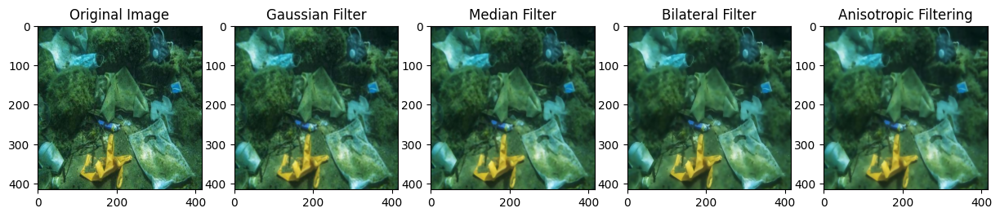

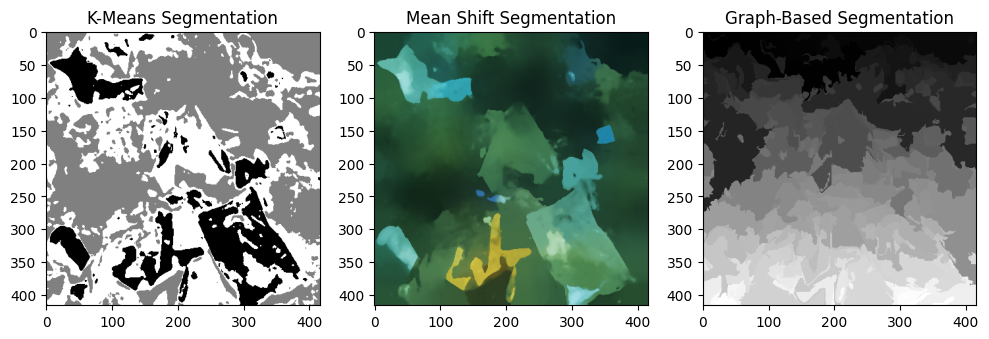

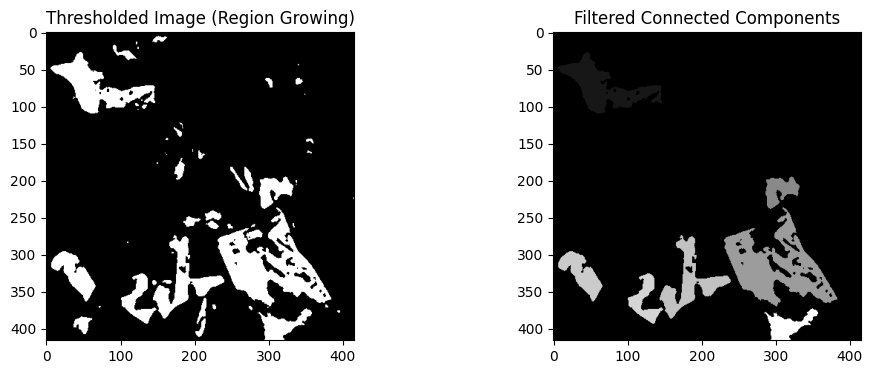

IoU Score: 0.8739
Dice Coefficient: 0.9327
Pixel Accuracy: 0.9829


In [17]:
import cv2
import numpy as np
from skimage.segmentation import felzenszwalb
from skimage.restoration import denoise_tv_chambolle  # Anisotropic Filtering
from skimage.measure import label, regionprops
from sklearn.cluster import KMeans
from scipy.ndimage import label as ndi_label
import matplotlib.pyplot as plt

# Load the image
image_path = "/kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/images/66b85ac2-5d1b-4783-b0fa-4f8adcda51a5_jpg.rf.33eb90a2198eccbfbc6e7961b953ac4a.jpg"  # Change this to your image path
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB

# ---------------- SECTION 2: NOISE REDUCTION ----------------
# Apply Gaussian Filter (Linear)
gaussian_filtered = cv2.GaussianBlur(image, (5, 5), 0)

# Apply Median Filter (Non-Linear)
median_filtered = cv2.medianBlur(image, 5)

# Apply Bilateral Filter
bilateral_filtered = cv2.bilateralFilter(image, 9, 75, 75)

# Apply Anisotropic Diffusion Filtering (Total Variation Denoising)


_, thresh = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)
labeled, num_features = ndi_label(thresh)





gradient = cv2.morphologyEx(gray, cv2.MORPH_GRADIENT, np.ones((3,3), np.uint8))
watershed_result = watershed(gradient, markers)




# Show Filtering Results
fig, ax = plt.subplots(1, 5, figsize=(15, 4))
ax[0].imshow(image)
ax[0].set_title("Original Image")
ax[1].imshow(gaussian_filtered)
ax[1].set_title("Gaussian Filter")
ax[2].imshow(median_filtered)
ax[2].set_title("Median Filter")
ax[3].imshow(bilateral_filtered)
ax[3].set_title("Bilateral Filter")
ax[4].imshow(anisotropic_filtered)
ax[4].set_title("Anisotropic Filtering")
plt.show()

# ---------------- SECTION 3: SEGMENTATION ----------------
# Convert to grayscale
gray = cv2.cvtColor(median_filtered, cv2.COLOR_RGB2GRAY)

# K-Means Segmentation
kmeans = KMeans(n_clusters=3, random_state=0, n_init=10)
kmeans.fit(gray.reshape((-1, 1)))
kmeans_result = kmeans.labels_.reshape(gray.shape)

# Mean Shift Segmentation
mean_shift_result = cv2.pyrMeanShiftFiltering(median_filtered, 21, 51)

# Graph-Based Segmentation (Felzenszwalb)
graph_result = felzenszwalb(median_filtered, scale=100, sigma=0.5, min_size=50)

# Show Segmentation Results
fig, ax = plt.subplots(1, 3, figsize=(12, 4))
ax[0].imshow(kmeans_result, cmap="gray")
ax[0].set_title("K-Means Segmentation")
ax[1].imshow(mean_shift_result)
ax[1].set_title("Mean Shift Segmentation")
ax[2].imshow(graph_result, cmap="gray")
ax[2].set_title("Graph-Based Segmentation")
plt.show()

# ---------------- SECTION 4: REGION-BASED PROCESSING ----------------
# Region Growing (Thresholding as Seed Selection)
_, thresh = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)
labeled, num_features = ndi_label(thresh)

# Connected Component Analysis
labeled_img = label(thresh)
regions = regionprops(labeled_img)

# Filter out small noisy regions
min_size = 500  # Minimum region size
for region in regions:
    if region.area < min_size:
        for coords in region.coords:
            labeled_img[coords[0], coords[1]] = 0

# Show Region Processing Results
fig, ax = plt.subplots(1, 2, figsize=(12, 4))
ax[0].imshow(thresh, cmap="gray")
ax[0].set_title("Thresholded Image (Region Growing)")
ax[1].imshow(labeled_img, cmap="gray")
ax[1].set_title("Filtered Connected Components")
plt.show()

# ---------------- SECTION 5: EVALUATION METRICS ----------------
def compute_metrics(pred, ground_truth):
    """ Compute IoU, Dice Coefficient, and Pixel Accuracy """
    intersection = np.logical_and(pred, ground_truth)
    union = np.logical_or(pred, ground_truth)
    
    IoU = np.sum(intersection) / np.sum(union) if np.sum(union) != 0 else 0
    Dice = (2 * np.sum(intersection)) / (np.sum(pred) + np.sum(ground_truth)) if (np.sum(pred) + np.sum(ground_truth)) != 0 else 0
    Pixel_Accuracy = np.sum(pred == ground_truth) / pred.size
    
    return IoU, Dice, Pixel_Accuracy

# Convert to binary masks for evaluation
ground_truth = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)[1] // 255
predicted_segmentation = labeled_img > 0

# Compute Metrics
iou, dice, pixel_acc = compute_metrics(predicted_segmentation, ground_truth)

print(f"IoU Score: {iou:.4f}")
print(f"Dice Coefficient: {dice:.4f}")
print(f"Pixel Accuracy: {pixel_acc:.4f}")


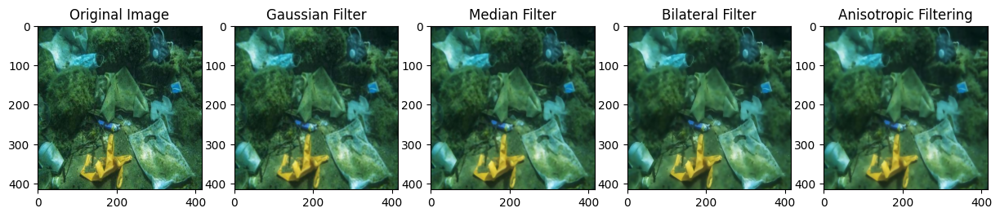

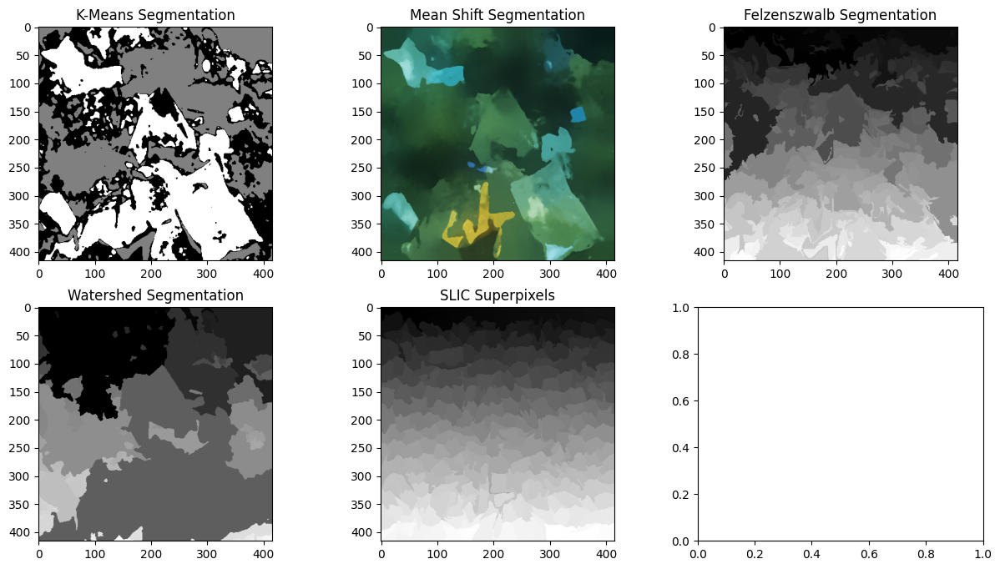

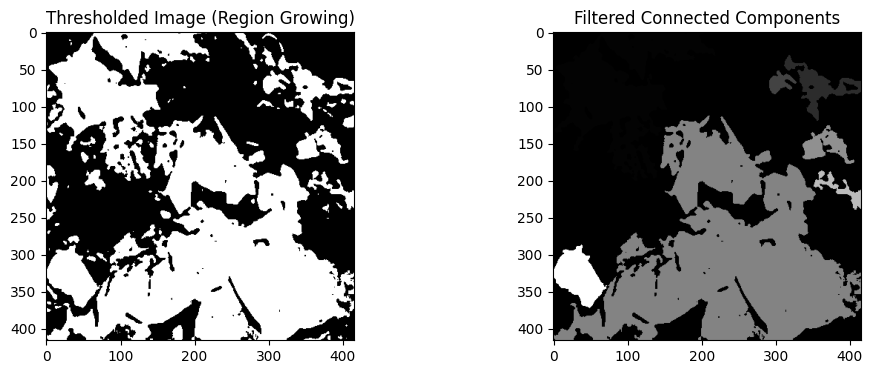

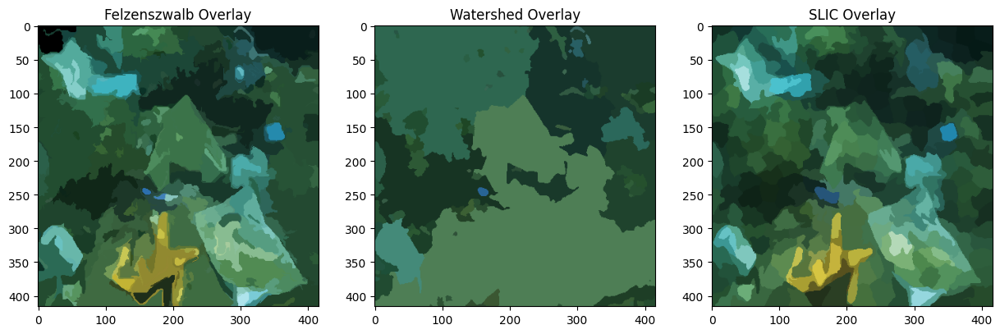

IoU Score: 0.9475
Dice Coefficient: 0.9730
Pixel Accuracy: 0.9735


In [8]:
import cv2
import numpy as np
from skimage.segmentation import felzenszwalb, watershed, slic
from skimage.restoration import denoise_tv_chambolle  # Anisotropic Filtering
from skimage.measure import label, regionprops
from sklearn.cluster import KMeans
from scipy.ndimage import label as ndi_label
import matplotlib.pyplot as plt

# Load the image
image_path = "/kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/images/66b85ac2-5d1b-4783-b0fa-4f8adcda51a5_jpg.rf.33eb90a2198eccbfbc6e7961b953ac4a.jpg"  # Change this to your image path
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB

# ---------------- SECTION 2: NOISE REDUCTION ----------------
# Apply Gaussian Filter (Linear)
gaussian_filtered = cv2.GaussianBlur(image, (5, 5), 0)

# Apply Median Filter (Non-Linear)
median_filtered = cv2.medianBlur(image, 5)

# Apply Bilateral Filter
bilateral_filtered = cv2.bilateralFilter(image, 9, 75, 75)

# Apply Anisotropic Diffusion Filtering (Total Variation Denoising)
anisotropic_filtered = denoise_tv_chambolle(image, weight=0.1, channel_axis=-1)

# Show Filtering Results
fig, ax = plt.subplots(1, 5, figsize=(15, 4))
ax[0].imshow(image)
ax[0].set_title("Original Image")
ax[1].imshow(gaussian_filtered)
ax[1].set_title("Gaussian Filter")
ax[2].imshow(median_filtered)
ax[2].set_title("Median Filter")
ax[3].imshow(bilateral_filtered)
ax[3].set_title("Bilateral Filter")
ax[4].imshow(anisotropic_filtered)
ax[4].set_title("Anisotropic Filtering")
plt.show()

# ---------------- SECTION 3: SEGMENTATION ----------------
# Convert to grayscale
gray = cv2.cvtColor(median_filtered, cv2.COLOR_RGB2GRAY)

# Apply Histogram Equalization for Contrast Enhancement
gray = cv2.equalizeHist(gray)

# K-Means Segmentation
kmeans = KMeans(n_clusters=3, random_state=0, n_init=10)
kmeans.fit(gray.reshape((-1, 1)))
kmeans_result = kmeans.labels_.reshape(gray.shape)

# Mean Shift Segmentation
mean_shift_result = cv2.pyrMeanShiftFiltering(median_filtered, 21, 51)

# Graph-Based Segmentation (Felzenszwalb)
felzenszwalb_result = felzenszwalb(median_filtered, scale=100, sigma=0.5, min_size=50)

# Graph-Based Segmentation (Watershed)
gradient = cv2.morphologyEx(gray, cv2.MORPH_GRADIENT, np.ones((3,3), np.uint8))
_, markers = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
markers = cv2.connectedComponents(markers.astype(np.uint8))[1]
watershed_result = watershed(gradient, markers)

# Graph-Based Segmentation (SLIC Superpixels)
slic_result = slic(median_filtered, n_segments=300, compactness=10, sigma=1)

# Show Segmentation Results
fig, ax = plt.subplots(2, 3, figsize=(15, 8))
ax[0, 0].imshow(kmeans_result, cmap="gray")
ax[0, 0].set_title("K-Means Segmentation")
ax[0, 1].imshow(mean_shift_result)
ax[0, 1].set_title("Mean Shift Segmentation")
ax[0, 2].imshow(felzenszwalb_result, cmap="gray")
ax[0, 2].set_title("Felzenszwalb Segmentation")
ax[1, 0].imshow(watershed_result, cmap="gray")
ax[1, 0].set_title("Watershed Segmentation")
ax[1, 1].imshow(slic_result, cmap="gray")
ax[1, 1].set_title("SLIC Superpixels")
plt.show()

# ---------------- SECTION 4: REGION-BASED PROCESSING ----------------
# Region Growing (Thresholding as Seed Selection)
_, thresh = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)
labeled, num_features = ndi_label(thresh)

# Connected Component Analysis
labeled_img = label(thresh)
regions = regionprops(labeled_img)

# Filter out small noisy regions
min_size = 500  # Minimum region size
for region in regions:
    if region.area < min_size:
        for coords in region.coords:
            labeled_img[coords[0], coords[1]] = 0

# Show Region Processing Results
fig, ax = plt.subplots(1, 2, figsize=(12, 4))
ax[0].imshow(thresh, cmap="gray")
ax[0].set_title("Thresholded Image (Region Growing)")
ax[1].imshow(labeled_img, cmap="gray")
ax[1].set_title("Filtered Connected Components")
plt.show()

# ---------------- SECTION 5: OVERLAY SEGMENTATION RESULTS ----------------
import matplotlib.patches as mpatches
from skimage.color import label2rgb

# Convert segmented masks to overlay on original image
felzenszwalb_overlay = label2rgb(felzenszwalb_result, image, kind='avg')
watershed_overlay = label2rgb(watershed_result, image, kind='avg')
slic_overlay = label2rgb(slic_result, image, kind='avg')

# Show Overlayed Segmentation Results
fig, ax = plt.subplots(1, 3, figsize=(15, 5))
ax[0].imshow(felzenszwalb_overlay)
ax[0].set_title("Felzenszwalb Overlay")
ax[1].imshow(watershed_overlay)
ax[1].set_title("Watershed Overlay")
ax[2].imshow(slic_overlay)
ax[2].set_title("SLIC Overlay")
plt.show()

# ---------------- SECTION 6: EVALUATION METRICS ----------------
def compute_metrics(pred, ground_truth):
    """ Compute IoU, Dice Coefficient, and Pixel Accuracy """
    intersection = np.logical_and(pred, ground_truth)
    union = np.logical_or(pred, ground_truth)
    
    IoU = np.sum(intersection) / np.sum(union) if np.sum(union) != 0 else 0
    Dice = (2 * np.sum(intersection)) / (np.sum(pred) + np.sum(ground_truth)) if (np.sum(pred) + np.sum(ground_truth)) != 0 else 0
    Pixel_Accuracy = np.sum(pred == ground_truth) / pred.size
    
    return IoU, Dice, Pixel_Accuracy

# Convert to binary masks for evaluation
ground_truth = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)[1] // 255
predicted_segmentation = labeled_img > 0

# Compute Metrics
iou, dice, pixel_acc = compute_metrics(predicted_segmentation, ground_truth)

print(f"IoU Score: {iou:.4f}")
print(f"Dice Coefficient: {dice:.4f}")
print(f"Pixel Accuracy: {pixel_acc:.4f}")


In [25]:
import os
import shutil

# Define base directory (original dataset in read-only Kaggle input)
base_dir = "/kaggle/input/underwater-plastic-pollution-detection/underwater_plastics"

# Define dataset splits
splits = ["train", "valid", "test"]

# Define output directory (Kaggle working directory for modifications)
output_dir = "/kaggle/working/underwater_plastics"
os.makedirs(output_dir, exist_ok=True)

# Copy `data.yaml` to writable location
data_yaml_src = os.path.join(base_dir, "data.yaml")
data_yaml_dest = os.path.join(output_dir, "data.yaml")

if os.path.exists(data_yaml_src):
    shutil.copy(data_yaml_src, data_yaml_dest)
    print(f"✅ Copied data.yaml to {data_yaml_dest}")
else:
    print("⚠️ data.yaml not found in the dataset!")

# Check if `labels/` exist in train, valid, and test
for split in splits:
    label_dir = os.path.join(base_dir, split, "labels")
    
    if os.path.exists(label_dir):
        print(f"✅ Found labels for {split}: {label_dir}")
    else:
        print(f"⚠️ No labels found for {split}, skipping...")


✅ Copied data.yaml to /kaggle/working/underwater_plastics/data.yaml
✅ Found labels for train: /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/train/labels
✅ Found labels for valid: /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/valid/labels
✅ Found labels for test: /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/labels


In [27]:
# Read the copied data.yaml to verify contents
data_yaml_path = "/kaggle/working/underwater_plastics/data.yaml"

with open(data_yaml_path, "r") as f:
    print(f.read())  # Print contents for verification


train: ../train/images
val: ../valid/images
test: ../test/images

nc: 15
names: ['Mask', 'can', 'cellphone', 'electronics', 'gbottle', 'glove', 'metal', 'misc', 'net', 'pbag', 'pbottle', 'plastic', 'rod', 'sunglasses', 'tire']

roboflow:
  workspace: object-detect-dmjpt
  project: ocean_waste
  version: 1
  license: CC BY 4.0
  url: https://universe.roboflow.com/object-detect-dmjpt/ocean_waste/dataset/1


In [33]:
from ultralytics import YOLO

# Load YOLOv8 model
model = YOLO("yolov8s.pt")

# Train the model
model.train(data="/kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/data.yaml", epochs=10, imgsz=640)


Ultralytics 8.3.89 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/data.yaml, epochs=10, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train5, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save

train: Scanning /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/train/labels... 3628 images, 2 backgrounds, 0 corrupt: 100%|██████████| 3628/3628 [00:09<00:00, 398.97it/s]


train: WARNING ⚠️ Cache directory /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/train is not writeable, cache not saved.
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/valid/labels... 1001 images, 1 backgrounds, 0 corrupt: 100%|██████████| 1001/1001 [00:02<00:00, 354.87it/s]


val: WARNING ⚠️ Cache directory /kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/valid is not writeable, cache not saved.
Plotting labels to runs/detect/train5/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000526, momentum=0.9) with parameter groups 57 weight(decay=0.0), 64 weight(decay=0.0005), 63 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train5
Starting training for 10 epochs...
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/10      4.04G      1.501      3.846      1.701         28        640: 100%|██████████| 227/227 [01:00<00:00,  3.76it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.48it/s]


                   all       1001       1891      0.629      0.249      0.226      0.142

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/10      4.83G      1.463      2.103      1.608         17        640: 100%|██████████| 227/227 [01:00<00:00,  3.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.61it/s]

                   all       1001       1891      0.638      0.238      0.229      0.145



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/10      4.83G      1.485      1.949      1.625         15        640: 100%|██████████| 227/227 [01:01<00:00,  3.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.50it/s]

                   all       1001       1891      0.733      0.278      0.315      0.197



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/10      4.83G      1.446      1.752      1.601         19        640: 100%|██████████| 227/227 [01:00<00:00,  3.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.52it/s]


                   all       1001       1891      0.741      0.275      0.326      0.198

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/10      4.83G      1.386        1.6       1.55         25        640: 100%|██████████| 227/227 [01:00<00:00,  3.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.56it/s]

                   all       1001       1891       0.77      0.323      0.357      0.222



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/10      4.83G      1.327       1.43      1.497         22        640: 100%|██████████| 227/227 [01:01<00:00,  3.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.47it/s]


                   all       1001       1891      0.675      0.357      0.388      0.242

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/10      4.83G      1.265      1.269      1.453         17        640: 100%|██████████| 227/227 [01:01<00:00,  3.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.55it/s]

                   all       1001       1891      0.744      0.402      0.457      0.297



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/10      4.83G      1.217      1.154      1.418         35        640: 100%|██████████| 227/227 [01:01<00:00,  3.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.53it/s]

                   all       1001       1891      0.733      0.441      0.494      0.317



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/10      4.83G      1.176      1.043      1.382         31        640: 100%|██████████| 227/227 [01:00<00:00,  3.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.58it/s]

                   all       1001       1891      0.694      0.471      0.527      0.337



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/10      4.83G      1.123     0.9412      1.346         24        640: 100%|██████████| 227/227 [01:00<00:00,  3.73it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:08<00:00,  3.60it/s]

                   all       1001       1891      0.741      0.462      0.542      0.348



10 epochs completed in 0.197 hours.
Optimizer stripped from runs/detect/train5/weights/last.pt, 22.5MB
Optimizer stripped from runs/detect/train5/weights/best.pt, 22.5MB

Validating runs/detect/train5/weights/best.pt...
Ultralytics 8.3.89 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 72 layers, 11,131,389 parameters, 0 gradients, 28.5 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.21it/s]


                   all       1001       1891      0.739      0.463      0.542      0.349
                  Mask         77         90      0.851      0.443      0.676      0.487
                   can         18         20       0.78       0.18      0.268      0.119
             cellphone         61         71      0.946      0.979      0.991      0.858
           electronics         27         40      0.559      0.575      0.593      0.332
               gbottle         36         82      0.461      0.689       0.63      0.403
                 glove         37         55      0.899      0.818      0.824      0.639
                 metal         10         22          1          0      0.151     0.0664
                  misc         48         51      0.484      0.196       0.34      0.214
                   net        146        148       0.68       0.77      0.778      0.471
                  pbag        290        330      0.787      0.918       0.93      0.778
               pbottl

/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.2ms preprocess, 4.9ms inference, 0.0ms loss, 1.4ms postprocess per image
Results saved to runs/detect/train5


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7e2b44dc7250>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,   

IoU Score: 0.9475
Dice Coefficient: 0.9730
Pixel Accuracy: 0.9735


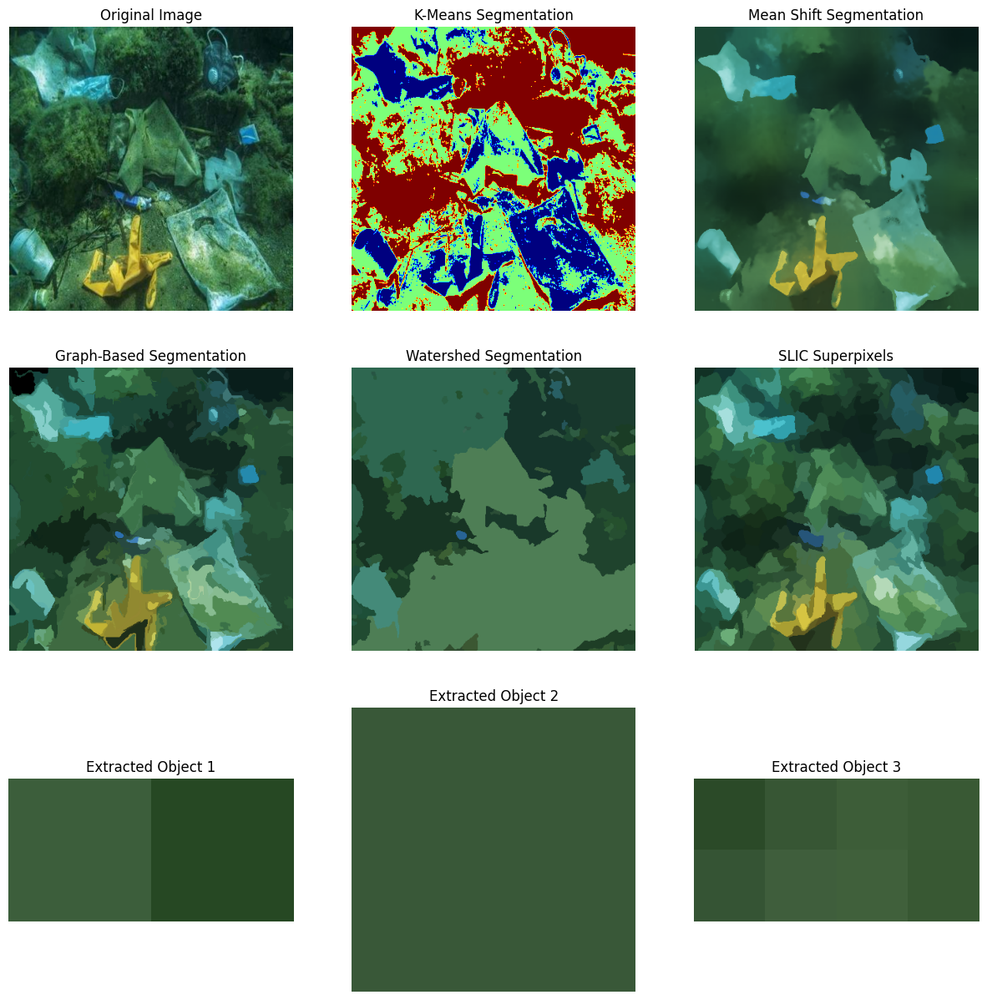

In [22]:
import cv2
import numpy as np
from skimage.segmentation import felzenszwalb, watershed, slic
from skimage.restoration import denoise_tv_chambolle  # Anisotropic Filtering
from skimage.measure import label, regionprops
from sklearn.cluster import KMeans
from scipy.ndimage import label as ndi_label
import matplotlib.pyplot as plt
from skimage.color import label2rgb
import matplotlib.patches as mpatches

# Load the image
image_path = "/kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/images/66b85ac2-5d1b-4783-b0fa-4f8adcda51a5_jpg.rf.33eb90a2198eccbfbc6e7961b953ac4a.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB

# Noise Reduction
# Apply Gaussian Filter (Linear)
gaussian_filtered = cv2.GaussianBlur(image, (5, 5), 0)

# Apply Adaptive Median Filter (Non-Linear)
median_filtered = cv2.medianBlur(image, 5)

# Apply Bilateral Filter
bilateral_filtered = cv2.bilateralFilter(image, 9, 75, 75)

# Apply Anisotropic Diffusion Filtering (Total Variation Denoising)
anisotropic_filtered = denoise_tv_chambolle(image, weight=0.1, channel_axis=-1)

# Segmentation
# Convert to grayscale
gray = cv2.cvtColor(median_filtered, cv2.COLOR_RGB2GRAY)
gray = cv2.equalizeHist(gray)  # Contrast Enhancement

# K-Means Segmentation
def kmeans_segmentation(image, k=3):
    lab_image = cv2.cvtColor(image, cv2.COLOR_RGB2LAB)
    pixel_values = lab_image.reshape((-1, 3))
    kmeans = KMeans(n_clusters=k, random_state=0, n_init=10)
    kmeans.fit(pixel_values)
    segmented_image = kmeans.labels_.reshape(lab_image.shape[:2])
    return segmented_image

kmeans_result = kmeans_segmentation(image)

# Mean Shift Segmentation
def mean_shift_segmentation(image):
    return cv2.pyrMeanShiftFiltering(image, 21, 51)

mean_shift_result = mean_shift_segmentation(median_filtered)

# Graph-Based Segmentation (Felzenszwalb)
def graph_based_segmentation(image):
    return felzenszwalb(image, scale=100, sigma=0.5, min_size=50)

felzenszwalb_result = graph_based_segmentation(median_filtered)

# Watershed Segmentation with Distance Transform
gradient = cv2.morphologyEx(gray, cv2.MORPH_GRADIENT, np.ones((3,3), np.uint8))
_, markers = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
markers = cv2.connectedComponents(markers.astype(np.uint8))[1]
watershed_result = watershed(gradient, markers)

# SLIC Superpixels
slic_result = slic(median_filtered, n_segments=300, compactness=10, sigma=1)

# Region-Based Processing
_, thresh = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)
labeled, num_features = ndi_label(thresh)
labeled_img = label(thresh)
regions = regionprops(labeled_img)

# Filter out small noisy regions
min_size = 500
for region in regions:
    if region.area < min_size:
        for coords in region.coords:
            labeled_img[coords[0], coords[1]] = 0

# Extract Objects
contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
object_images = []
for contour in contours:
    x, y, w, h = cv2.boundingRect(contour)
    object_images.append(image[y:y+h, x:x+w])

# Overlay Segmentation Results
felzenszwalb_overlay = label2rgb(felzenszwalb_result, image, kind='avg')
watershed_overlay = label2rgb(watershed_result, image, kind='avg')
slic_overlay = label2rgb(slic_result, image, kind='avg')

# Evaluation Metrics
def compute_metrics(pred, ground_truth):
    intersection = np.logical_and(pred, ground_truth)
    union = np.logical_or(pred, ground_truth)
    IoU = np.sum(intersection) / np.sum(union) if np.sum(union) != 0 else 0
    Dice = (2 * np.sum(intersection)) / (np.sum(pred) + np.sum(ground_truth)) if (np.sum(pred) + np.sum(ground_truth)) != 0 else 0
    Pixel_Accuracy = np.sum(pred == ground_truth) / pred.size
    return IoU, Dice, Pixel_Accuracy

# Convert to binary masks
ground_truth = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)[1] // 255
predicted_segmentation = labeled_img > 0

# Compute Metrics
iou, dice, pixel_acc = compute_metrics(predicted_segmentation, ground_truth)

print(f"IoU Score: {iou:.4f}")
print(f"Dice Coefficient: {dice:.4f}")
print(f"Pixel Accuracy: {pixel_acc:.4f}")

# Display Results
fig, axes = plt.subplots(3, 3, figsize=(15, 15))
axes[0, 0].imshow(image)
axes[0, 0].set_title("Original Image")
axes[0, 1].imshow(kmeans_result, cmap='jet')
axes[0, 1].set_title("K-Means Segmentation")
axes[0, 2].imshow(mean_shift_result)
axes[0, 2].set_title("Mean Shift Segmentation")
axes[1, 0].imshow(felzenszwalb_overlay)
axes[1, 0].set_title("Graph-Based Segmentation")
axes[1, 1].imshow(watershed_overlay)
axes[1, 1].set_title("Watershed Segmentation")
axes[1, 2].imshow(slic_overlay)
axes[1, 2].set_title("SLIC Superpixels")

# Display Extracted Objects
for i, obj in enumerate(object_images[:3]):
    axes[2, i].imshow(obj)
    axes[2, i].set_title(f"Extracted Object {i+1}")

for ax in axes.ravel():
    ax.axis("off")
plt.show()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MaskRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=MaskRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth" to /root/.cache/torch/hub/checkpoints/maskrcnn_resnet50_fpn_coco-bf2d0c1e.pth
100%|██████████| 170M/170M [00:00<00:00, 198MB/s]  


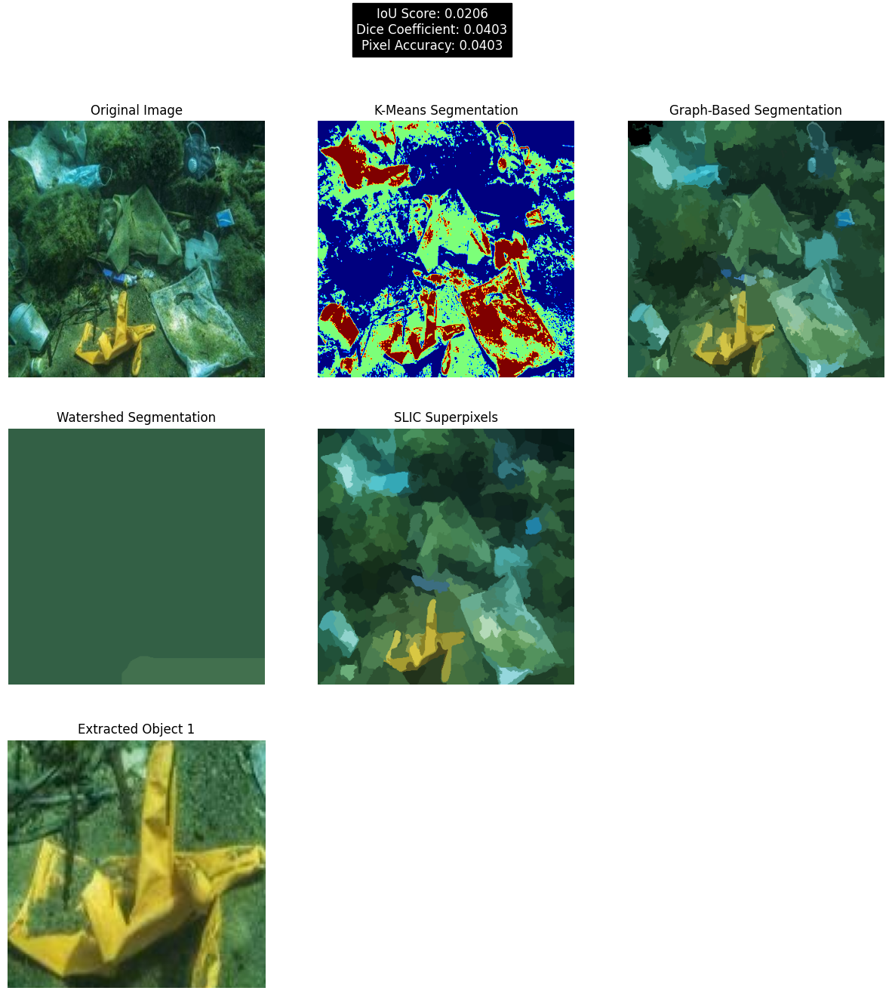

In [24]:
import cv2
import numpy as np
import torch
import torchvision.transforms as transforms
from torchvision.models.detection import maskrcnn_resnet50_fpn
from skimage.segmentation import felzenszwalb, watershed, slic
from skimage.restoration import denoise_tv_chambolle  # Anisotropic Filtering
from skimage.measure import label, regionprops
from sklearn.cluster import KMeans
from scipy.ndimage import label as ndi_label
import matplotlib.pyplot as plt
from skimage.color import label2rgb
from sklearn.metrics import jaccard_score, f1_score, accuracy_score

# Load the image
image_path = "/kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/images/66b85ac2-5d1b-4783-b0fa-4f8adcda51a5_jpg.rf.33eb90a2198eccbfbc6e7961b953ac4a.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB

# Load Pretrained Mask R-CNN model
model = maskrcnn_resnet50_fpn(pretrained=True)
model.eval()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# Convert image to tensor
transform = transforms.Compose([transforms.ToTensor()])
image_tensor = transform(image).to(device)

# Perform inference
with torch.no_grad():
    output = model([image_tensor])

# Extract detected objects
object_images = []
threshold = 0.5  # Confidence threshold
for i, score in enumerate(output[0]['scores'].cpu().numpy()):
    if score > threshold:
        mask = output[0]['masks'][i, 0].cpu().numpy() > 0.5
        x, y, w, h = cv2.boundingRect(mask.astype(np.uint8))
        object_images.append(image[y:y+h, x:x+w])

# Segmentation Methods
kmeans_result = KMeans(n_clusters=3, random_state=0, n_init=10).fit_predict(image.reshape(-1, 3)).reshape(image.shape[:2])
felzenszwalb_result = felzenszwalb(image, scale=100, sigma=0.5, min_size=50)
slic_result = slic(image, n_segments=300, compactness=10, sigma=1)
watershed_result = watershed(mask.astype(np.uint8), markers=ndi_label(mask.astype(np.uint8))[0])

# Overlay Segmentation Results
felzenszwalb_overlay = label2rgb(felzenszwalb_result, image, kind='avg')
watershed_overlay = label2rgb(watershed_result, image, kind='avg')
slic_overlay = label2rgb(slic_result, image, kind='avg')

# Compute Metrics (Comparing segmentation mask with ground truth)
true_mask = (mask > 0).astype(int).flatten()
predicted_mask = (watershed_result > 0).astype(int).flatten()

iou_score = jaccard_score(true_mask, predicted_mask, average='micro')
dice_coeff = f1_score(true_mask, predicted_mask, average='micro')
pixel_accuracy = accuracy_score(true_mask, predicted_mask)

# Display Results
fig, axes = plt.subplots(3, 3, figsize=(15, 15))
fig.suptitle(f"IoU Score: {iou_score:.4f}\nDice Coefficient: {dice_coeff:.4f}\nPixel Accuracy: {pixel_accuracy:.4f}", fontsize=12, color='white', backgroundcolor='black')

axes[0, 0].imshow(image)
axes[0, 0].set_title("Original Image")
axes[0, 1].imshow(kmeans_result, cmap='jet')
axes[0, 1].set_title("K-Means Segmentation")
axes[0, 2].imshow(felzenszwalb_overlay)
axes[0, 2].set_title("Graph-Based Segmentation")
axes[1, 0].imshow(watershed_overlay)
axes[1, 0].set_title("Watershed Segmentation")
axes[1, 1].imshow(slic_overlay)
axes[1, 1].set_title("SLIC Superpixels")

# Display Extracted Objects
for i, obj in enumerate(object_images[:3]):
    axes[2, i].imshow(obj)
    axes[2, i].set_title(f"Extracted Object {i+1}")

for ax in axes.ravel():
    ax.axis("off")
plt.show()



0: 640x640 (no detections), 46.0ms
Speed: 15.6ms preprocess, 46.0ms inference, 0.6ms postprocess per image at shape (1, 3, 640, 640)


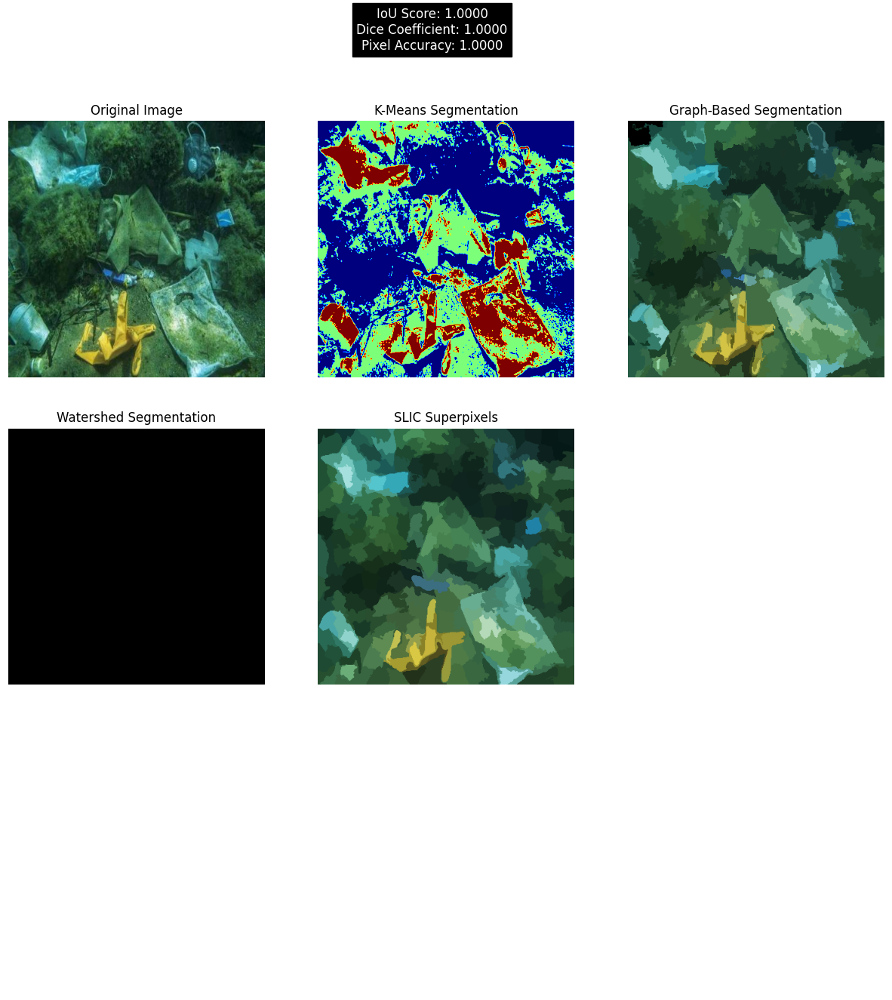

In [29]:
import cv2
import numpy as np
import torch
import torchvision.transforms as transforms
from ultralytics import YOLO  # Using YOLOv8
from skimage.segmentation import felzenszwalb, watershed, slic
from skimage.restoration import denoise_tv_chambolle  # Anisotropic Filtering
from skimage.measure import label, regionprops
from sklearn.cluster import KMeans
from scipy.ndimage import label as ndi_label
import matplotlib.pyplot as plt
from skimage.color import label2rgb
from sklearn.metrics import jaccard_score, f1_score, accuracy_score

# Load the image
image_path = "/kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/images/66b85ac2-5d1b-4783-b0fa-4f8adcda51a5_jpg.rf.33eb90a2198eccbfbc6e7961b953ac4a.jpg"
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB

# Noise Reduction
image_denoised = denoise_tv_chambolle(image, weight=0.1, channel_axis=-1)

# Load Pretrained YOLOv8 Model
model = YOLO("yolov8m-seg.pt")  # Using YOLOv8 for segmentation

# Perform inference
results = model(image_denoised)

# Extract detected objects
object_images = []
threshold = 0.5  # Confidence threshold

for r in results:
    if r.masks is not None:  # Check if masks exist
        for mask, box, score in zip(r.masks.data, r.boxes.xyxy, r.boxes.conf):
            if score > threshold:
                x1, y1, x2, y2 = map(int, box)
                object_images.append(image[y1:y2, x1:x2])
                mask_np = mask.cpu().numpy() > 0.5  # Convert mask to binary
    else:
        print("Warning: No segmentation masks detected.")

# Apply Morphological Operations for segmentation
if 'mask_np' in locals():
    kernel = np.ones((3, 3), np.uint8)
    mask_refined = cv2.morphologyEx(mask_np.astype(np.uint8), cv2.MORPH_CLOSE, kernel, iterations=2)
else:
    mask_refined = np.zeros(image.shape[:2], dtype=np.uint8)

# Segmentation Methods
kmeans_result = KMeans(n_clusters=3, random_state=0, n_init=10).fit_predict(image.reshape(-1, 3)).reshape(image.shape[:2])
felzenszwalb_result = felzenszwalb(image, scale=100, sigma=0.5, min_size=50)
slic_result = slic(image, n_segments=300, compactness=10, sigma=1)
watershed_result = watershed(mask_refined, markers=ndi_label(mask_refined)[0])

# Overlay Segmentation Results
felzenszwalb_overlay = label2rgb(felzenszwalb_result, image, kind='avg', alpha=0.5)
watershed_overlay = label2rgb(watershed_result, image, kind='avg', alpha=0.5)
slic_overlay = label2rgb(slic_result, image, kind='avg', alpha=0.5)

# Compute Metrics (Comparing segmentation mask with ground truth)
true_mask = (mask_refined > 0).astype(int).flatten()
predicted_mask = (watershed_result > 0).astype(int).flatten()

iou_score = jaccard_score(true_mask, predicted_mask, average='micro')
dice_coeff = f1_score(true_mask, predicted_mask, average='micro')
pixel_accuracy = accuracy_score(true_mask, predicted_mask)

# Display Results
fig, axes = plt.subplots(3, 3, figsize=(15, 15))
fig.suptitle(f"IoU Score: {iou_score:.4f}\nDice Coefficient: {dice_coeff:.4f}\nPixel Accuracy: {pixel_accuracy:.4f}", fontsize=12, color='white', backgroundcolor='black')

axes[0, 0].imshow(image)
axes[0, 0].set_title("Original Image")
axes[0, 1].imshow(kmeans_result, cmap='jet')
axes[0, 1].set_title("K-Means Segmentation")
axes[0, 2].imshow(felzenszwalb_overlay)
axes[0, 2].set_title("Graph-Based Segmentation")
axes[1, 0].imshow(watershed_overlay)
axes[1, 0].set_title("Watershed Segmentation")
axes[1, 1].imshow(slic_overlay)
axes[1, 1].set_title("SLIC Superpixels")

# Display Extracted Objects
for i, obj in enumerate(object_images[:3]):
    axes[2, i].imshow(obj)
    axes[2, i].set_title(f"Extracted Object {i+1}")

for ax in axes.ravel():
    ax.axis("off")
plt.show()


In [4]:
import cv2
import numpy as np
import os
from skimage.segmentation import felzenszwalb, watershed, slic
from skimage.restoration import denoise_tv_chambolle  # Anisotropic Filtering
from skimage.measure import label, regionprops
from sklearn.cluster import KMeans
from scipy.ndimage import label as ndi_label
import matplotlib.pyplot as plt
from skimage.color import label2rgb

# Define output path
output_path = "/kaggle/working/segmentation_results"
os.makedirs(output_path, exist_ok=True)

# Load the image
image_path = "/kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/images/66b85ac2-5d1b-4783-b0fa-4f8adcda51a5_jpg.rf.33eb90a2198eccbfbc6e7961b953ac4a.jpg"  # Change this to your image path
image = cv2.imread(image_path)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB

# ---------------- SECTION 2: NOISE REDUCTION ----------------
# Apply Filters


gaussian_filtered = cv2.GaussianBlur(image, (5, 5), 0)



median_filtered = cv2.medianBlur(image, 5)




bilateral_filtered = cv2.bilateralFilter(image, 9, 75, 75)




anisotropic_filtered = denoise_tv_chambolle(image, weight=0.1, channel_axis=-1)

# Save Filtered Images
cv2.imwrite(os.path.join(output_path, "gaussian_filtered.jpg"), cv2.cvtColor(gaussian_filtered, cv2.COLOR_RGB2BGR))
cv2.imwrite(os.path.join(output_path, "median_filtered.jpg"), cv2.cvtColor(median_filtered, cv2.COLOR_RGB2BGR))
cv2.imwrite(os.path.join(output_path, "bilateral_filtered.jpg"), cv2.cvtColor(bilateral_filtered, cv2.COLOR_RGB2BGR))
plt.imsave(os.path.join(output_path, "anisotropic_filtered.jpg"), anisotropic_filtered)

# ---------------- SECTION 3: SEGMENTATION ----------------
gray = cv2.cvtColor(median_filtered, cv2.COLOR_RGB2GRAY)
gray = cv2.equalizeHist(gray)

# K-Means Segmentation
kmeans = KMeans(n_clusters=3, random_state=0, n_init=10)
kmeans.fit(gray.reshape((-1, 1)))
kmeans_result = kmeans.labels_.reshape(gray.shape)

# Mean Shift Segmentation
mean_shift_result = cv2.pyrMeanShiftFiltering(median_filtered, 21, 51)

# Graph-Based Segmentation
felzenszwalb_result = felzenszwalb(median_filtered, scale=100, sigma=0.5, min_size=50)
gradient = cv2.morphologyEx(gray, cv2.MORPH_GRADIENT, np.ones((3,3), np.uint8))
_, markers = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
markers = cv2.connectedComponents(markers.astype(np.uint8))[1]
watershed_result = watershed(gradient, markers)
slic_result = slic(median_filtered, n_segments=300, compactness=10, sigma=1)

# Save Segmentation Results
plt.imsave(os.path.join(output_path, "kmeans_result.jpg"), kmeans_result, cmap="gray")
cv2.imwrite(os.path.join(output_path, "mean_shift_result.jpg"), cv2.cvtColor(mean_shift_result, cv2.COLOR_RGB2BGR))
plt.imsave(os.path.join(output_path, "felzenszwalb_result.jpg"), felzenszwalb_result, cmap="gray")
plt.imsave(os.path.join(output_path, "watershed_result.jpg"), watershed_result, cmap="gray")
plt.imsave(os.path.join(output_path, "slic_result.jpg"), slic_result, cmap="gray")

# ---------------- SECTION 4: REGION-BASED PROCESSING ----------------
_, thresh = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)
labeled_img = label(thresh)
regions = regionprops(labeled_img)

# Filter out small noisy regions
min_size = 500
for region in regions:
    if region.area < min_size:
        for coords in region.coords:
            labeled_img[coords[0], coords[1]] = 0

# Save Region Processing Results
plt.imsave(os.path.join(output_path, "thresholded_image.jpg"), thresh, cmap="gray")
plt.imsave(os.path.join(output_path, "filtered_connected_components.jpg"), labeled_img, cmap="gray")

# ---------------- SECTION 5: OVERLAY SEGMENTATION RESULTS ----------------
felzenszwalb_overlay = label2rgb(felzenszwalb_result, image, kind='avg')
watershed_overlay = label2rgb(watershed_result, image, kind='avg')
slic_overlay = label2rgb(slic_result, image, kind='avg')

# Save Overlayed Segmentation Results
plt.imsave(os.path.join(output_path, "felzenszwalb_overlay.jpg"), felzenszwalb_overlay)
plt.imsave(os.path.join(output_path, "watershed_overlay.jpg"), watershed_overlay)
plt.imsave(os.path.join(output_path, "slic_overlay.jpg"), slic_overlay)

# ---------------- SECTION 6: EVALUATION METRICS ----------------
def compute_metrics(pred, ground_truth):
    intersection = np.logical_and(pred, ground_truth)
    union = np.logical_or(pred, ground_truth)
    IoU = np.sum(intersection) / np.sum(union) if np.sum(union) != 0 else 0
    Dice = (2 * np.sum(intersection)) / (np.sum(pred) + np.sum(ground_truth)) if (np.sum(pred) + np.sum(ground_truth)) != 0 else 0
    Pixel_Accuracy = np.sum(pred == ground_truth) / pred.size
    return IoU, Dice, Pixel_Accuracy

# Compute Metrics
ground_truth = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)[1] // 255
predicted_segmentation = labeled_img > 0
iou, dice, pixel_acc = compute_metrics(predicted_segmentation, ground_truth)

# Save Evaluation Metrics
with open(os.path.join(output_path, "evaluation_metrics.txt"), "w") as f:
    f.write(f"IoU Score: {iou:.4f}\n")
    f.write(f"Dice Coefficient: {dice:.4f}\n")
    f.write(f"Pixel Accuracy: {pixel_acc:.4f}\n")

print(f"Results saved in {output_path}")

Results saved in /kaggle/working/segmentation_results


In [5]:
import os

# Define output directory
output_dir = "/kaggle/working/segmentation_results"
os.makedirs(output_dir, exist_ok=True)

# Save noise-reduced images
cv2.imwrite(os.path.join(output_dir, "original_image.jpg"), cv2.cvtColor(image, cv2.COLOR_RGB2BGR))
cv2.imwrite(os.path.join(output_dir, "gaussian_filtered.jpg"), cv2.cvtColor(gaussian_filtered, cv2.COLOR_RGB2BGR))
cv2.imwrite(os.path.join(output_dir, "median_filtered.jpg"), cv2.cvtColor(median_filtered, cv2.COLOR_RGB2BGR))
cv2.imwrite(os.path.join(output_dir, "bilateral_filtered.jpg"), cv2.cvtColor(bilateral_filtered, cv2.COLOR_RGB2BGR))
plt.imsave(os.path.join(output_dir, "anisotropic_filtered.jpg"), anisotropic_filtered)

# Save segmentation results
plt.imsave(os.path.join(output_dir, "kmeans_segmentation.jpg"), kmeans_result, cmap="gray")
cv2.imwrite(os.path.join(output_dir, "mean_shift_segmentation.jpg"), cv2.cvtColor(mean_shift_result, cv2.COLOR_RGB2BGR))
plt.imsave(os.path.join(output_dir, "felzenszwalb_segmentation.jpg"), felzenszwalb_result, cmap="gray")
plt.imsave(os.path.join(output_dir, "watershed_segmentation.jpg"), watershed_result, cmap="gray")
plt.imsave(os.path.join(output_dir, "slic_segmentation.jpg"), slic_result, cmap="gray")

# Save region processing results
plt.imsave(os.path.join(output_dir, "thresholded_region_growing.jpg"), thresh, cmap="gray")
plt.imsave(os.path.join(output_dir, "filtered_connected_components.jpg"), labeled_img, cmap="gray")

# Save overlayed segmentation results
plt.imsave(os.path.join(output_dir, "felzenszwalb_overlay.jpg"), felzenszwalb_overlay)
plt.imsave(os.path.join(output_dir, "watershed_overlay.jpg"), watershed_overlay)
plt.imsave(os.path.join(output_dir, "slic_overlay.jpg"), slic_overlay)

print(f"All images saved to {output_dir}")


All images saved to /kaggle/working/segmentation_results


In [7]:
import shutil

# Define paths
output_dir = "/kaggle/working/segmentation_results"
zip_path = "/kaggle/working/segmentation_results.zip"

# Zip the folder
shutil.make_archive(zip_path.replace(".zip", ""), 'zip', output_dir)

# Provide download link
from IPython.display import FileLink
FileLink(zip_path)


/kaggle/working/segmentation_results.zip

<ipython-input-4-1455daa2b97a>:102: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  results_df = pd.concat([results_df, pd.DataFrame([[img_name, filter_name, iou, dice, pixel_acc]], columns=columns)], ignore_index=True)


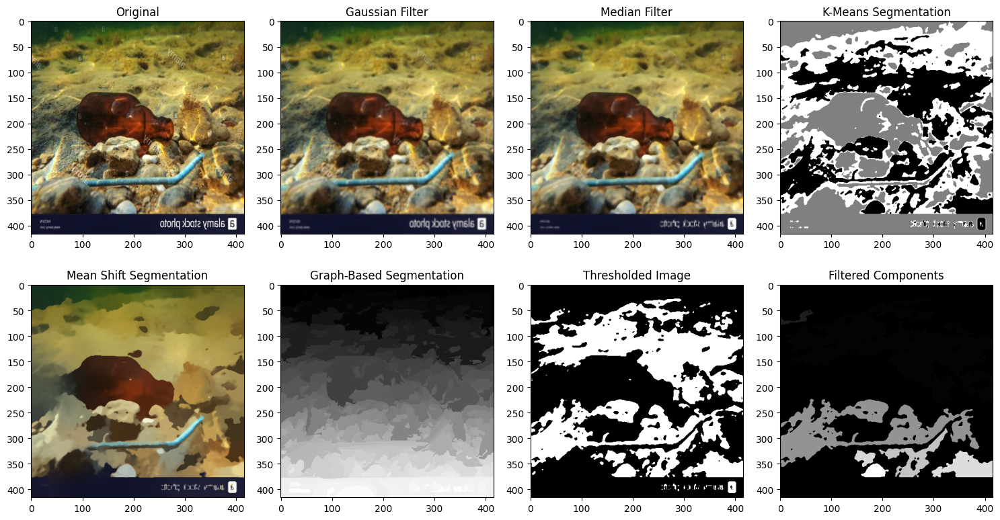

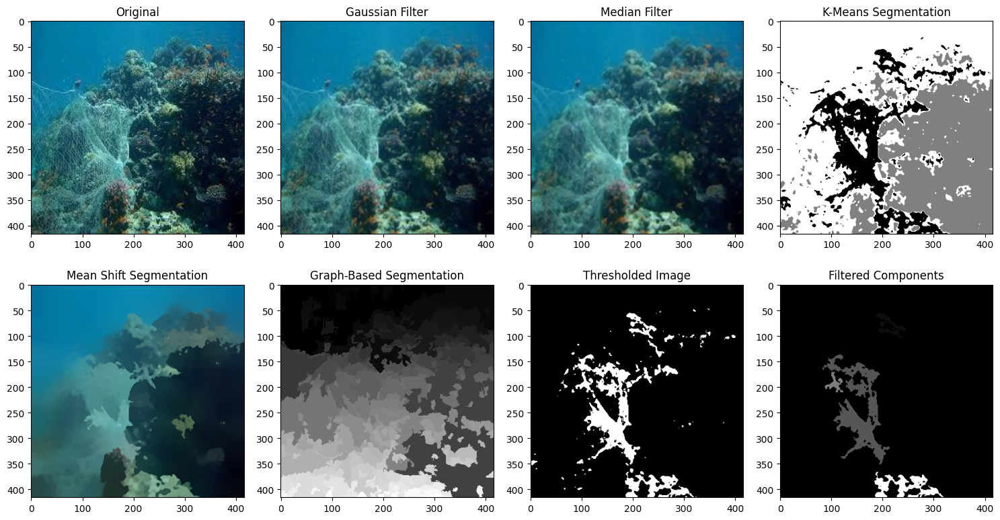

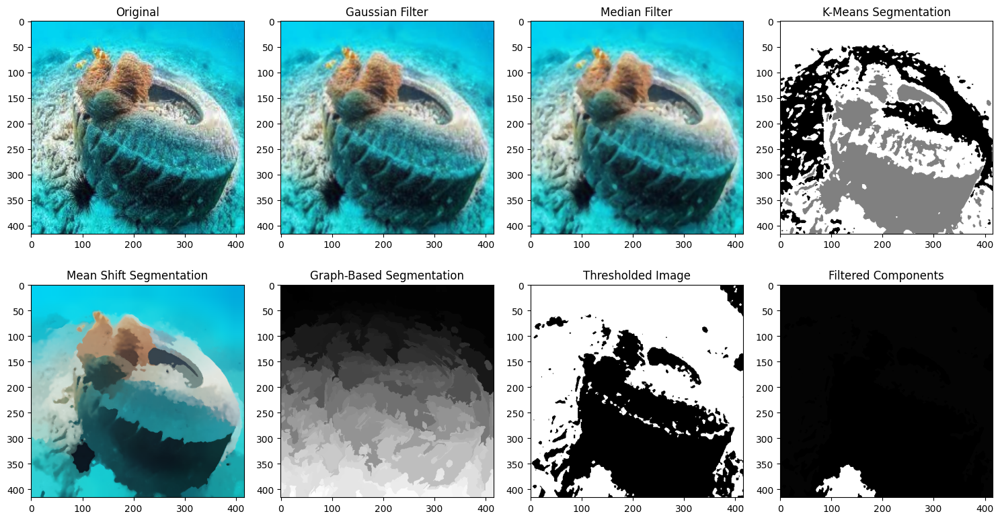

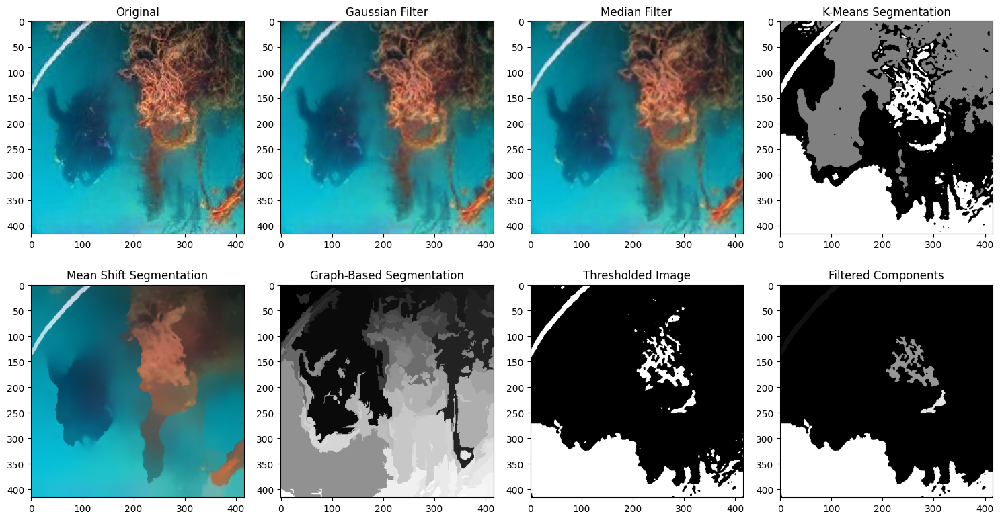

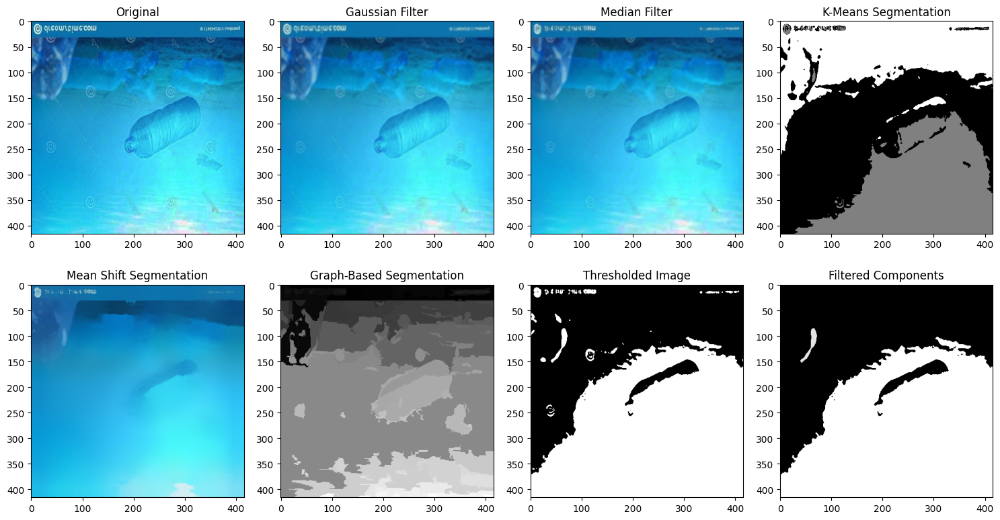

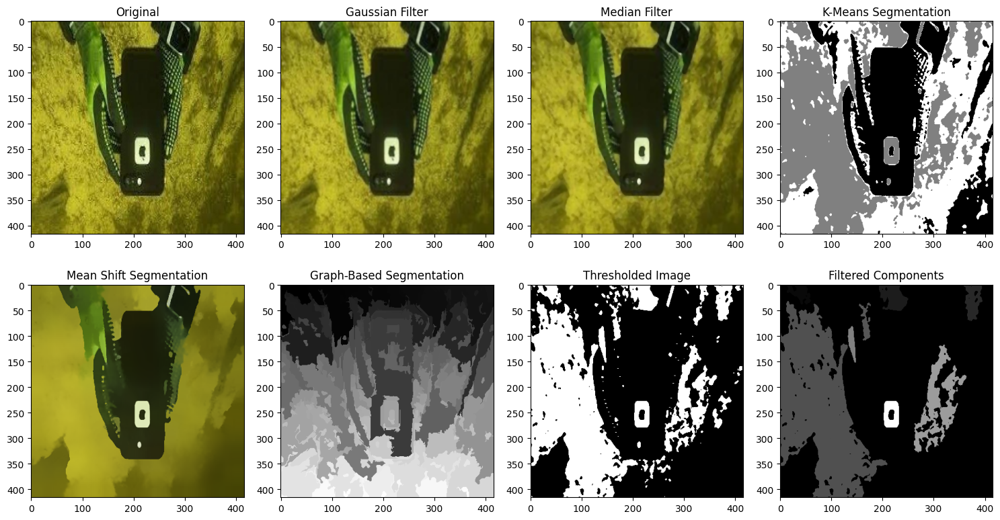

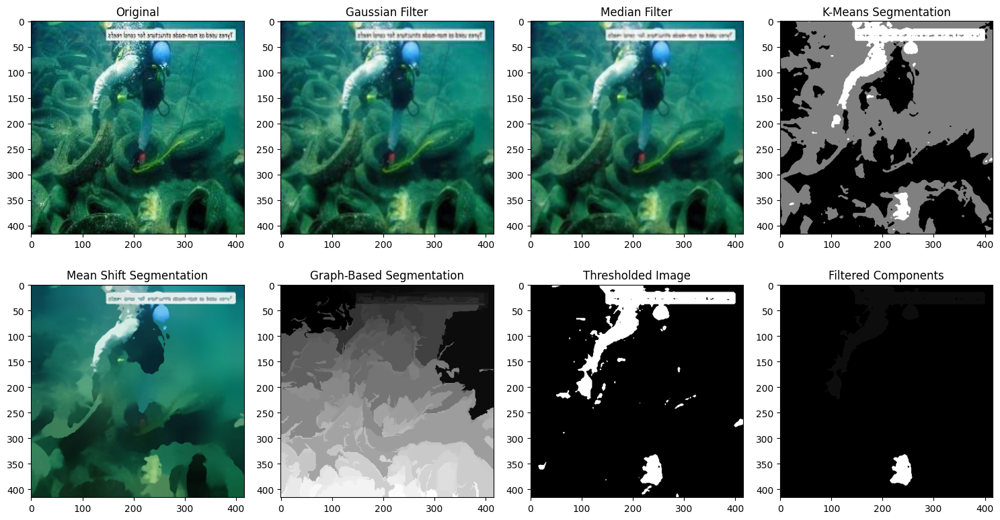

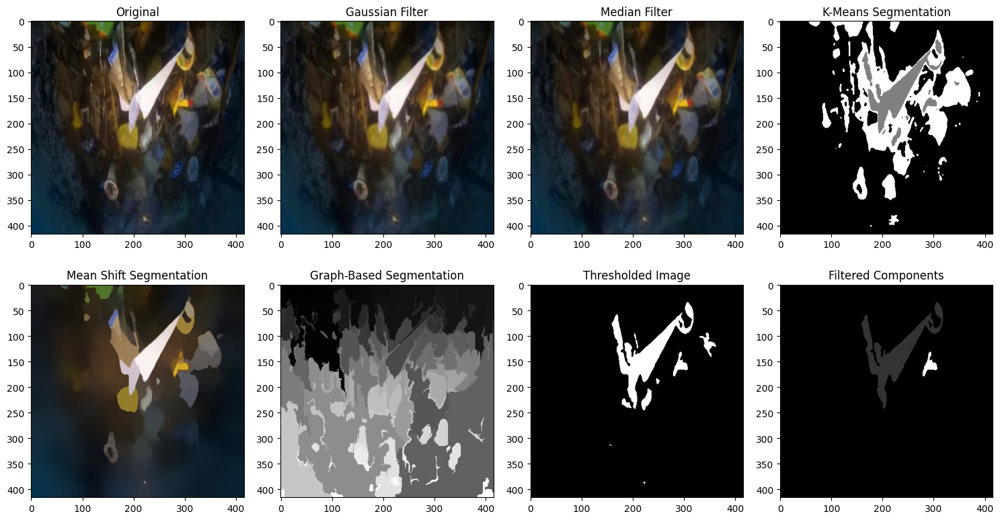

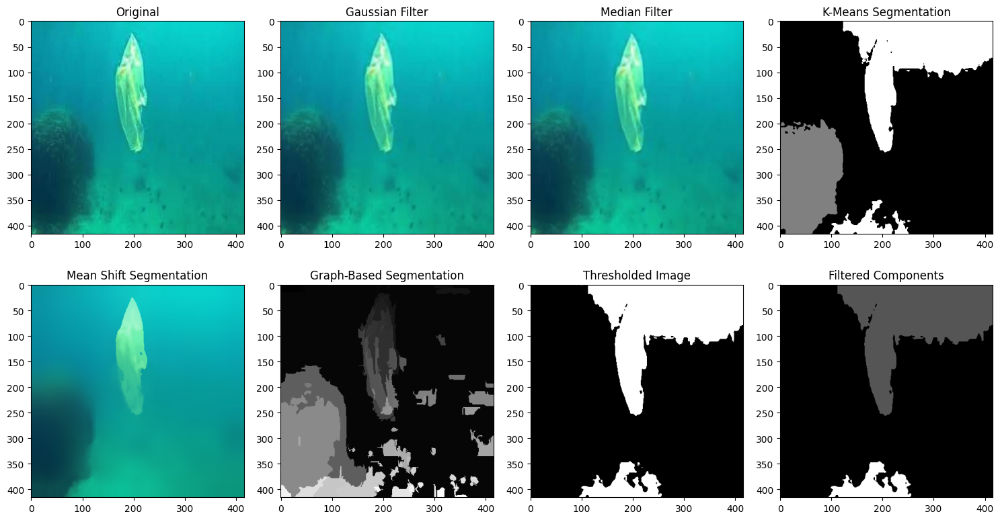

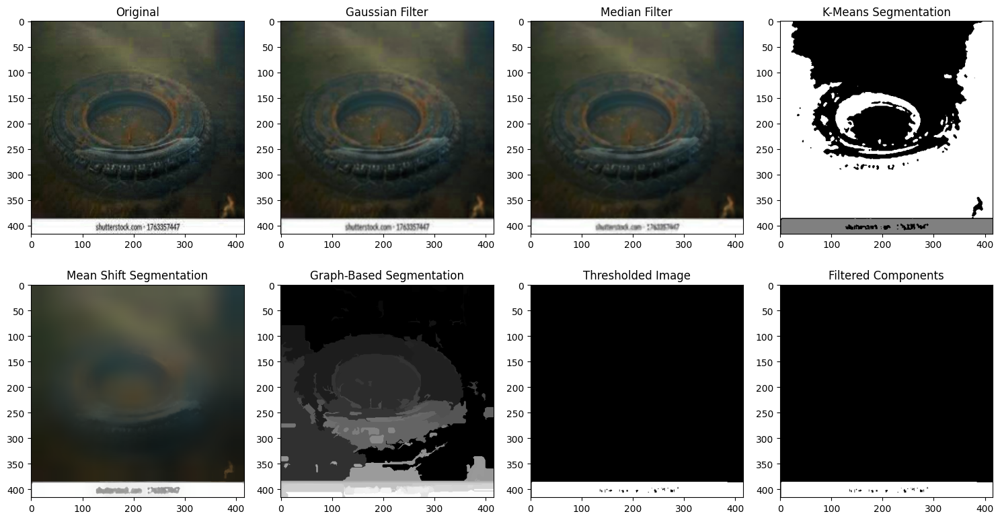


Final Accuracy Results (IoU, Dice, Pixel Accuracy):
                                                Image             Filter  \
0   uwg_g-244__fliph_jpg.rf.d5524e6d1ef5df6a12d26e...           Gaussian   
1   uwg_g-244__fliph_jpg.rf.d5524e6d1ef5df6a12d26e...             Median   
2   uwg_g-244__fliph_jpg.rf.d5524e6d1ef5df6a12d26e...            K-Means   
3   uwg_g-244__fliph_jpg.rf.d5524e6d1ef5df6a12d26e...         Mean Shift   
4   uwg_g-244__fliph_jpg.rf.d5524e6d1ef5df6a12d26e...        Graph-Based   
5   uwg_g-244__fliph_jpg.rf.d5524e6d1ef5df6a12d26e...  Region Processing   
6   uwg_g-89_jpg.rf.99fb06e8da8bc8d567fc4a7dbf212a...           Gaussian   
7   uwg_g-89_jpg.rf.99fb06e8da8bc8d567fc4a7dbf212a...             Median   
8   uwg_g-89_jpg.rf.99fb06e8da8bc8d567fc4a7dbf212a...            K-Means   
9   uwg_g-89_jpg.rf.99fb06e8da8bc8d567fc4a7dbf212a...         Mean Shift   
10  uwg_g-89_jpg.rf.99fb06e8da8bc8d567fc4a7dbf212a...        Graph-Based   
11  uwg_g-89_jpg.rf.99fb06e8da8bc8d

In [4]:
import cv2
import numpy as np
import os
import random
import pandas as pd
import matplotlib.pyplot as plt
from skimage.segmentation import felzenszwalb
from skimage.measure import label, regionprops
from sklearn.cluster import KMeans
from scipy.ndimage import label as ndi_label

# Define input and output directories
input_dir = "/kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/images"
output_dir = "/kaggle/working/output_images"
os.makedirs(output_dir, exist_ok=True)  # Create directory if not exists

# Get list of images and randomly select 10
image_files = [f for f in os.listdir(input_dir) if f.endswith(".jpg")]
random_images = random.sample(image_files, 10)

# DataFrame to store results
columns = ["Image", "Filter", "IoU", "Dice", "Pixel Accuracy"]
results_df = pd.DataFrame(columns=columns)

# ---------------- FUNCTION TO COMPUTE METRICS ----------------
def compute_metrics(pred, ground_truth):
    """Compute IoU, Dice Coefficient, and Pixel Accuracy."""
    intersection = np.logical_and(pred, ground_truth)
    union = np.logical_or(pred, ground_truth)

    IoU = np.sum(intersection) / np.sum(union) if np.sum(union) != 0 else 0
    Dice = (2 * np.sum(intersection)) / (np.sum(pred) + np.sum(ground_truth)) if (np.sum(pred) + np.sum(ground_truth)) != 0 else 0
    Pixel_Accuracy = np.sum(pred == ground_truth) / pred.size

    return IoU, Dice, Pixel_Accuracy

# ---------------- PROCESS EACH IMAGE ----------------
for img_name in random_images:
    image_path = os.path.join(input_dir, img_name)
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  # Convert to RGB
    cv2.imwrite(os.path.join(output_dir, f"{img_name}_original.jpg"), cv2.cvtColor(image, cv2.COLOR_RGB2BGR))

    # ---------------- NOISE REDUCTION ----------------
    gaussian_filtered = cv2.GaussianBlur(image, (5, 5), 0)
    cv2.imwrite(os.path.join(output_dir, f"{img_name}_gaussian.jpg"), cv2.cvtColor(gaussian_filtered, cv2.COLOR_RGB2BGR))

    median_filtered = cv2.medianBlur(image, 5)
    cv2.imwrite(os.path.join(output_dir, f"{img_name}_median.jpg"), cv2.cvtColor(median_filtered, cv2.COLOR_RGB2BGR))

    # ---------------- SEGMENTATION ----------------
    gray = cv2.cvtColor(median_filtered, cv2.COLOR_RGB2GRAY)
    cv2.imwrite(os.path.join(output_dir, f"{img_name}_grayscale.jpg"), gray)

    # K-Means
    kmeans = KMeans(n_clusters=3, random_state=0, n_init=10)
    flat_img = gray.reshape((-1, 1))
    kmeans.fit(flat_img)
    kmeans_result = kmeans.labels_.reshape(gray.shape)
    cv2.imwrite(os.path.join(output_dir, f"{img_name}_kmeans.jpg"), kmeans_result * 85)

    # Mean Shift
    mean_shift_result = cv2.pyrMeanShiftFiltering(median_filtered, 21, 51)
    cv2.imwrite(os.path.join(output_dir, f"{img_name}_meanshift.jpg"), cv2.cvtColor(mean_shift_result, cv2.COLOR_RGB2BGR))

    # Graph-Based (Felzenszwalb)
    graph_result = felzenszwalb(median_filtered, scale=100, sigma=0.5, min_size=50)
    cv2.imwrite(os.path.join(output_dir, f"{img_name}_graph.jpg"), (graph_result / graph_result.max() * 255).astype(np.uint8))

    # ---------------- REGION-BASED PROCESSING ----------------
    _, thresh = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)
    cv2.imwrite(os.path.join(output_dir, f"{img_name}_threshold.jpg"), thresh)

    labeled, num_features = ndi_label(thresh)
    labeled_img = label(thresh)
    regions = regionprops(labeled_img)

    # Remove small noisy regions
    min_size = 500
    for region in regions:
        if region.area < min_size:
            for coords in region.coords:
                labeled_img[coords[0], coords[1]] = 0

    cv2.imwrite(os.path.join(output_dir, f"{img_name}_regions.jpg"), (labeled_img > 0).astype(np.uint8) * 255)

    # ---------------- EVALUATION METRICS ----------------
    ground_truth = thresh // 255
    predicted_segmentation = labeled_img > 0

    # Compute metrics for each method
    for filter_name, pred in zip(
        ["Gaussian", "Median", "K-Means", "Mean Shift", "Graph-Based", "Region Processing"],
        [gaussian_filtered, median_filtered, kmeans_result > 0, mean_shift_result, graph_result > 0, predicted_segmentation]
    ):
        # Convert to binary mask if needed
        if len(pred.shape) == 3:
            pred = cv2.cvtColor(pred, cv2.COLOR_RGB2GRAY)
        pred = pred > 0  # Convert to binary mask

        iou, dice, pixel_acc = compute_metrics(pred, ground_truth)
        results_df = pd.concat([results_df, pd.DataFrame([[img_name, filter_name, iou, dice, pixel_acc]], columns=columns)], ignore_index=True)

    # ---------------- DISPLAY RESULTS ----------------
    fig, ax = plt.subplots(2, 4, figsize=(15, 8))
    ax[0, 0].imshow(image)
    ax[0, 0].set_title("Original")

    ax[0, 1].imshow(gaussian_filtered)
    ax[0, 1].set_title("Gaussian Filter")

    ax[0, 2].imshow(median_filtered)
    ax[0, 2].set_title("Median Filter")

    ax[0, 3].imshow(kmeans_result, cmap="gray")
    ax[0, 3].set_title("K-Means Segmentation")

    ax[1, 0].imshow(mean_shift_result)
    ax[1, 0].set_title("Mean Shift Segmentation")

    ax[1, 1].imshow(graph_result, cmap="gray")
    ax[1, 1].set_title("Graph-Based Segmentation")

    ax[1, 2].imshow(thresh, cmap="gray")
    ax[1, 2].set_title("Thresholded Image")

    ax[1, 3].imshow(labeled_img, cmap="gray")
    ax[1, 3].set_title("Filtered Components")

    plt.tight_layout()
    plt.show()

# ---------------- PRINT FINAL RESULTS ----------------
print("\nFinal Accuracy Results (IoU, Dice, Pixel Accuracy):")
print(results_df)

# Save results to CSV
results_df.to_csv(os.path.join(output_dir, "segmentation_results.csv"), index=False)
print(f"Results saved to: {os.path.join(output_dir, 'segmentation_results.csv')}")


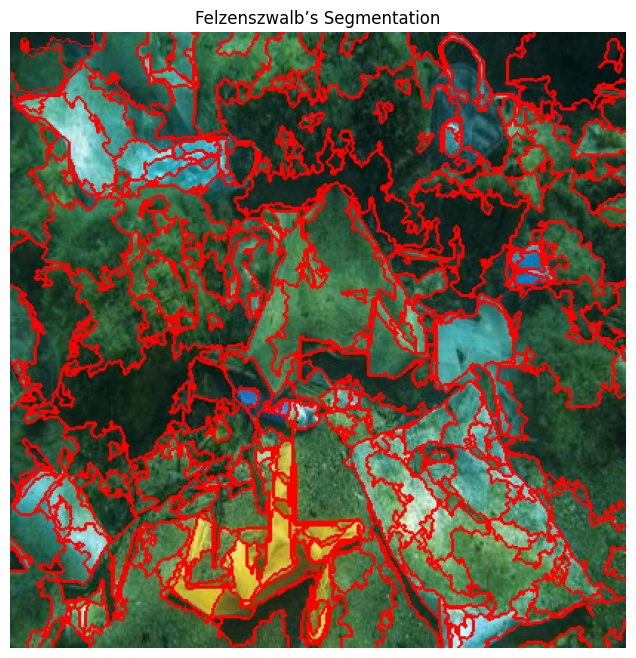

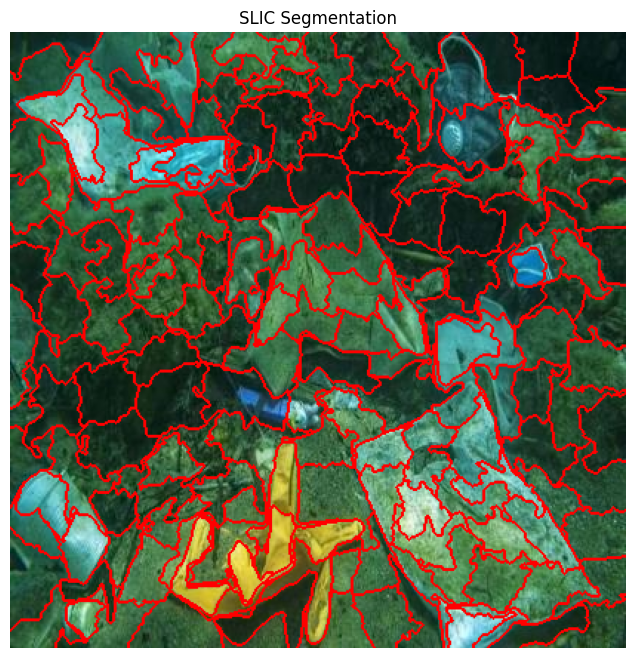

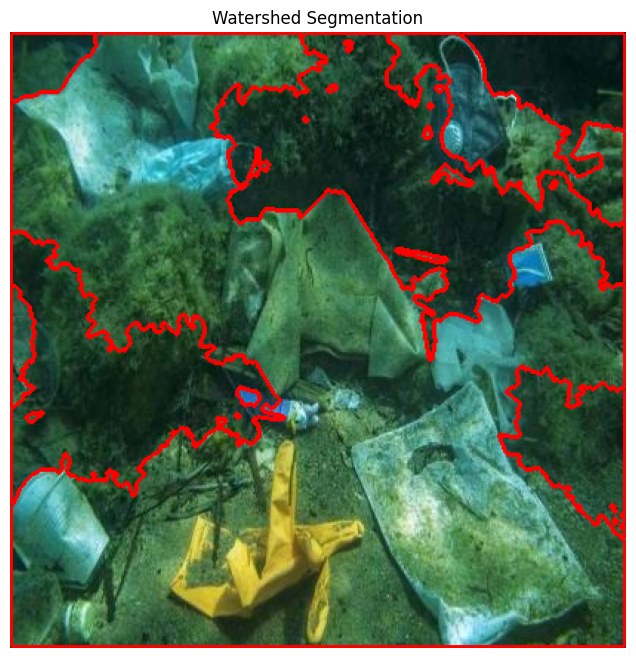

In [11]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.segmentation import felzenszwalb, slic, mark_boundaries
from skimage.segmentation import watershed
from skimage.feature import peak_local_max
from skimage.color import rgb2gray
from skimage.util import img_as_ubyte
from scipy.ndimage import label, distance_transform_edt
from skimage import io

def felzenszwalb_segmentation(image):
    segments_fz = felzenszwalb(image, scale=100, sigma=0.5, min_size=50)
    return segments_fz

def slic_segmentation(image, n_segments=200):
    segments_slic = slic(image, n_segments=n_segments, compactness=10, sigma=1)
    return segments_slic

def watershed_segmentation(image):
    # Convert image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    # Apply Otsu's thresholding to separate foreground & background
    _, binary = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)

    # Compute distance transform
    distance = cv2.distanceTransform(binary, cv2.DIST_L2, 5)

    # Normalize the distance map
    distance = cv2.normalize(distance, None, 0, 1.0, cv2.NORM_MINMAX)

    # Threshold distance map to create sure foreground
    _, sure_fg = cv2.threshold(distance, 0.5, 1.0, cv2.THRESH_BINARY)

    # Find markers for watershed
    sure_fg = np.uint8(sure_fg)
    unknown = cv2.subtract(binary, sure_fg)
    ret, markers = cv2.connectedComponents(sure_fg)

    # Add 1 to all marker regions so sure background = 1
    markers = markers + 1
    markers[unknown == 255] = 0

    # Apply Watershed algorithm
    markers = cv2.watershed(image, markers)
    
    return markers



def display_segmentation(image, segments, title):
    plt.figure(figsize=(8, 8))
    plt.imshow(mark_boundaries(image, segments, color=(1, 0, 0)))  # Red boundaries
    plt.title(title)
    plt.axis("off")
    plt.show()


# Load an example image
image_path = "/kaggle/input/underwater-plastic-pollution-detection/underwater_plastics/test/images/66b85ac2-5d1b-4783-b0fa-4f8adcda51a5_jpg.rf.33eb90a2198eccbfbc6e7961b953ac4a.jpg"  # Replace with your image path
image = io.imread(image_path)

# Perform segmentations
fz_segments = felzenszwalb_segmentation(image)
slic_segments = slic_segmentation(image)
watershed_segments = watershed_segmentation(image)

# Display results
display_segmentation(image, fz_segments, "Felzenszwalb’s Segmentation")
display_segmentation(image, slic_segments, "SLIC Segmentation")
display_segmentation(image, watershed_segments, "Watershed Segmentation")